In [1]:
import scanpy as sc
import anndata as ann
import numpy as np 
import seaborn as sb
import pandas as pd
import pickle
from sklearn import preprocessing as pp
import time
from scipy import sparse

import sys  
from importlib import reload  
import helper
reload(helper)
import helper as h

import expected_multiplet_rate as emr
reload(emr)
import expected_multiplet_rate as emr

from matplotlib import rcParams
import matplotlib.pyplot as plt

#R interface
import rpy2.rinterface_lib.callbacks
import logging
from rpy2.robjects import pandas2ri
import anndata2ri

rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)
pandas2ri.activate()
anndata2ri.activate()
%load_ext rpy2.ipython

In [2]:
%%R
library(scran)
library(biomaRt)
library(BiocParallel)
#library(Seurat)

In [3]:
# Path for saving results - last shared folder by all datasets
shared_folder = '/dss/dsshome1/lxc07/gobi009/data/' + 'GSE114297/'

In [4]:
#Load data
adata = sc.read_h5ad(shared_folder + 'data_normalised.h5ad')
#adata = h.open_h5ad(shared_folder + 'data_normalised.h5ad', unique_id2=UID2)
#adata = sc.read(shared_folder + 'data_normalised.h5ad')

## Load gene IDs

In [5]:
# Use EID info from cellrange data
# Assumes that all samples have same features, thus performs this for single sample

# Read CellRanger feature info
features_f = pd.read_table(shared_folder + 'UPR_features.tsv', header=None)
features_f.columns = ['EID', 'gene_symbol_adata', 'feature_type'][:features_f.shape[1]]
features_f.index = features_f['EID']

# map gene names from Cellranger to gene names used in adata
af = ann.AnnData(var=features_f)
af.var_names = features_f['gene_symbol_adata']
af.var_names_make_unique()
features_f['gene_symbol_adata'] = af.var_names

# load features from adata
features_used = adata.var_names
# Keep only features in adata
features_f.index = features_f['gene_symbol_adata']
adata.var['EID'] = features_f.loc[features_used, 'EID']

## Visualisation

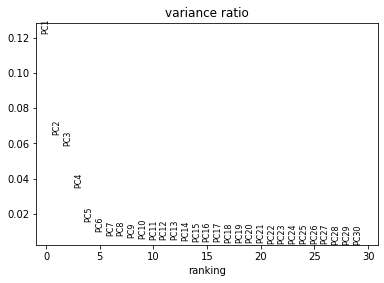

In [6]:
sc.pp.pca(adata, n_comps=30, use_highly_variable=True, svd_solver='arpack')
sc.pl.pca_variance_ratio(adata)

In [7]:
# Select number of PCs to use
N_PCS = 7

Compare different embeddings based on previously defined annotation. 

In [8]:
sc.pp.neighbors(adata,n_pcs = N_PCS) 
sc.tl.umap(adata)

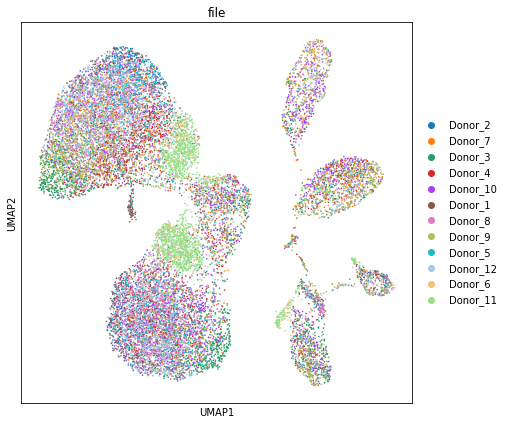

In [9]:
rcParams['figure.figsize'] = (7, 7)
sc.pl.umap(adata, size=10, color=['file'])

#### On scaled data

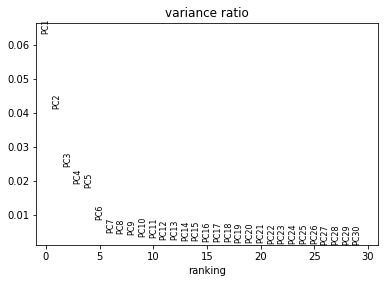

In [10]:
# Scale data and perform PCA
adata_scl = adata.copy()
sc.pp.scale(adata_scl, max_value=10)
sc.pp.pca(adata_scl, n_comps=30, use_highly_variable=True, svd_solver='arpack')
rcParams['figure.figsize'] = (6, 4)
sc.pl.pca_variance_ratio(adata_scl)

In [11]:
#C: Can stay the same as above
N_PCS

7

In [12]:
# neighbours on scaled data
sc.pp.neighbors(adata_scl,n_pcs = 7) 

In [13]:
# Umap on scaled data
sc.tl.umap(adata_scl)

In [14]:
# Add scaled embedding to adata
adata.obsm['X_umap_scl'] = adata_scl.obsm['X_umap']

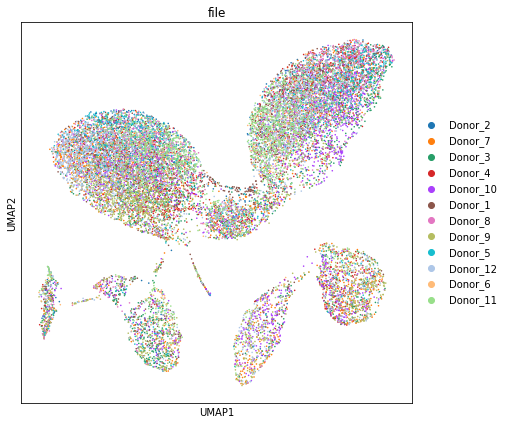

In [15]:
rcParams['figure.figsize'] = (7,7)
sc.pl.umap(adata_scl, size=10, color=['file'])

## Cell cycle
Performed separately for individual batches.

 ### Cyclone - based on G1, S, and G2/M scores

Add gene Entrez IDs to adata in order to map genes to cell cycle database.

In [16]:
cyclone_anno = pickle.load(open(shared_folder + 'cyclone_anno.pkl', 'rb'))

In [17]:
# Count of cells annotated to each phase
cyclone_anno.phase_cyclone.value_counts()

G1     18839
S        321
G2M      120
Name: phase_cyclone, dtype: int64

In [18]:
# Add cyclone annotation to adata
cyclone_anno = cyclone_anno.reindex(adata.obs.index)
adata.obs = pd.concat([adata.obs,cyclone_anno], axis=1)

In [19]:
adata.write_h5ad(shared_folder + 'after_cyclone.h5ad')

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'phase_cyclone' as categorical


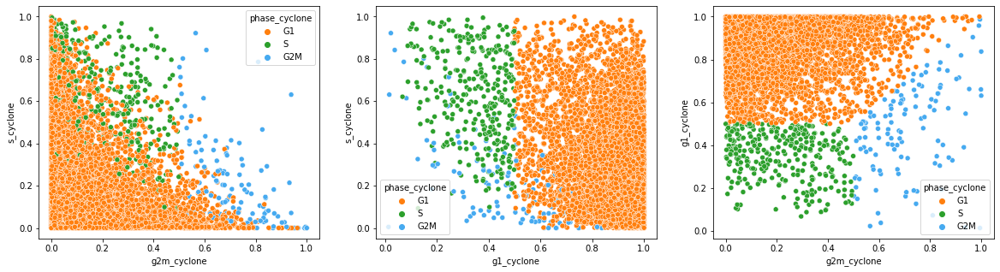

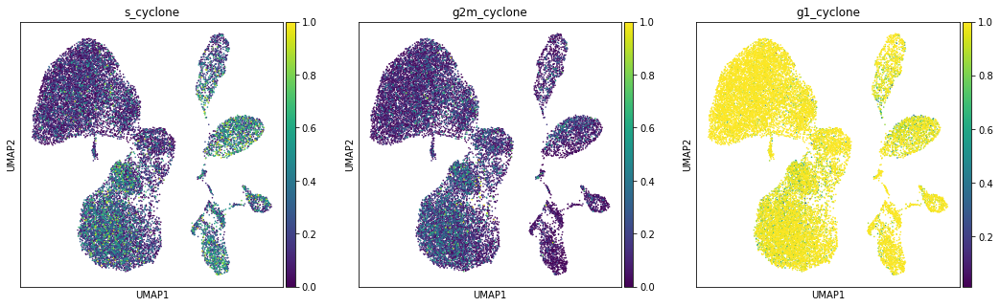

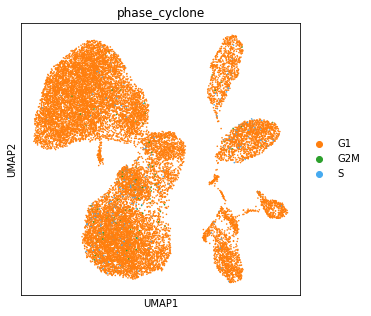

In [20]:
# Plot score distributions and cell assignment on UMAP
rcParams['figure.figsize'] = (20,5)
fig,axs = plt.subplots(1, 3)
palette = sb.color_palette(['#ff7f0e', '#2ca02c', '#46aaf0'])
sb.scatterplot(x='g2m_cyclone', y='s_cyclone', hue='phase_cyclone', data=cyclone_anno, ax=axs[0], palette=palette)
sb.scatterplot(x='g1_cyclone', y='s_cyclone', hue='phase_cyclone', data=cyclone_anno, ax=axs[1], palette=palette)
sb.scatterplot(x='g2m_cyclone', y='g1_cyclone', hue='phase_cyclone', data=cyclone_anno, ax=axs[2], palette=palette)
rcParams['figure.figsize'] = (5,5)
sc.pl.umap(adata, color=['s_cyclone', 'g2m_cyclone', 'g1_cyclone'], size=10, use_raw=False)
adata.uns['phase_cyclone_colors'] = ['#ff7f0e', '#2ca02c', '#46aaf0']
sc.pl.umap(adata, color=['phase_cyclone'], size=10, use_raw=False)

MKI67 expression for comparison with cell cycle anno:

In [21]:
print('MKI67 in adata:', sum(adata.var.index == 'MKI67'))
print('MKI67 in adata_raw (only gene expression filtering):', sum(adata.raw.var.index == 'MKI67'))
print('MKI67 in cellranger data:', features_f.query('gene_symbol_adata == "MKI67"').shape[0])

MKI67 in adata: 1
MKI67 in adata_raw (only gene expression filtering): 1
MKI67 in cellranger data: 1


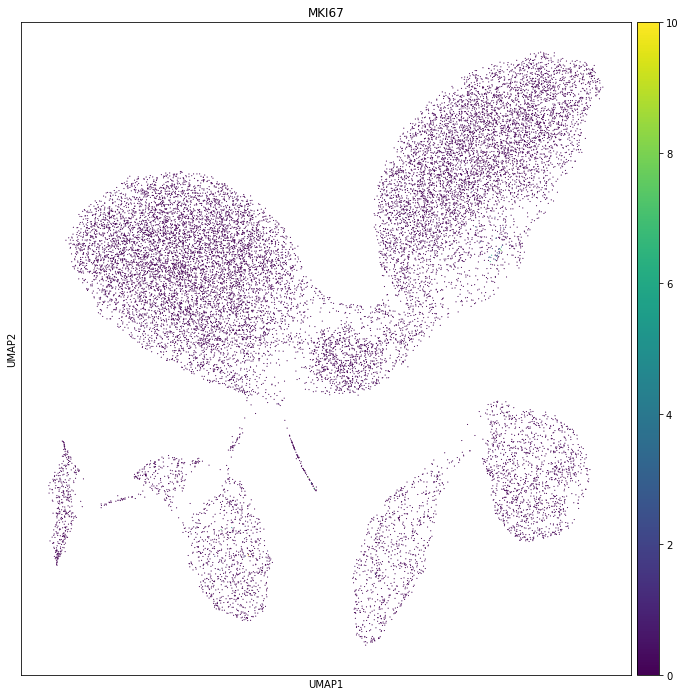

Amount of cells MKI67 is expressed in: 50
Total amount of cells: 19280


In [22]:
rcParams['figure.figsize'] = (12, 12)
sc.pl.umap(adata_scl, color='MKI67' ,size=5, use_raw=True)
print('Amount of cells MKI67 is expressed in:', adata.var.loc['MKI67']['n_cells'])
print('Total amount of cells:', adata_scl.X.shape[0])

## Save intermediate results before cell type annotation

# Cell type annotation

In [23]:
# adata = h.open_h5ad(shared_folder+"data_annotated.h5ad",unique_id2=UID2)
# adata = sc.read(shared_folder+"data_annotated.h5ad")
# adata = pickle.load(open(shared_folder + 'data_annotated.pkl', 'rb'))
# adata = pickle.load(open(shared_folder + 'data_normalised.pkl', 'rb'))
adata

AnnData object with n_obs × n_vars = 19280 × 15252
    obs: 'file', 'n_counts', 'n_genes', 'mt_frac', 'n_counts_filter', 'n_genes_filter', 'mt_frac_filter', 'doublet_score', 'doublet', 'doublet_score_filter', 'size_factors', 'phase_cyclone', 's_cyclone', 'g2m_cyclone', 'g1_cyclone'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'EID'
    uns: 'doublet_score_filter_colors', 'file_colors', 'hvg', 'mt_frac_filter_colors', 'n_counts_filter_colors', 'n_genes_filter_colors', 'pca', 'neighbors', 'umap', 'phase_cyclone_colors'
    obsm: 'X_pca', 'X_umap', 'X_umap_scl'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

## Endo high annotation

In [24]:
# Normalise raw data for cell type scoring
adata_rawnorm = adata.raw.to_adata().copy()
adata_rawnorm.X /= adata.obs['size_factors'].values[:, None] # This reshapes the size-factors array
sc.pp.log1p(adata_rawnorm)
adata_rawnorm.X = np.asarray(adata_rawnorm.X)
adata_rawnorm.obs = adata.obs.copy()

#### Ins

In [25]:
# Compute Ins score
sc.tl.score_genes(adata_rawnorm, gene_list=['INS'], score_name='ins_score',  use_raw=False)

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


/gpfs/scratch/pn25xo/gobi009/gobi009/ipykernel_46699/1510249817.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ins_scores['ins_score_norm'] = pp.minmax_scale(ins_scores.ins_score)


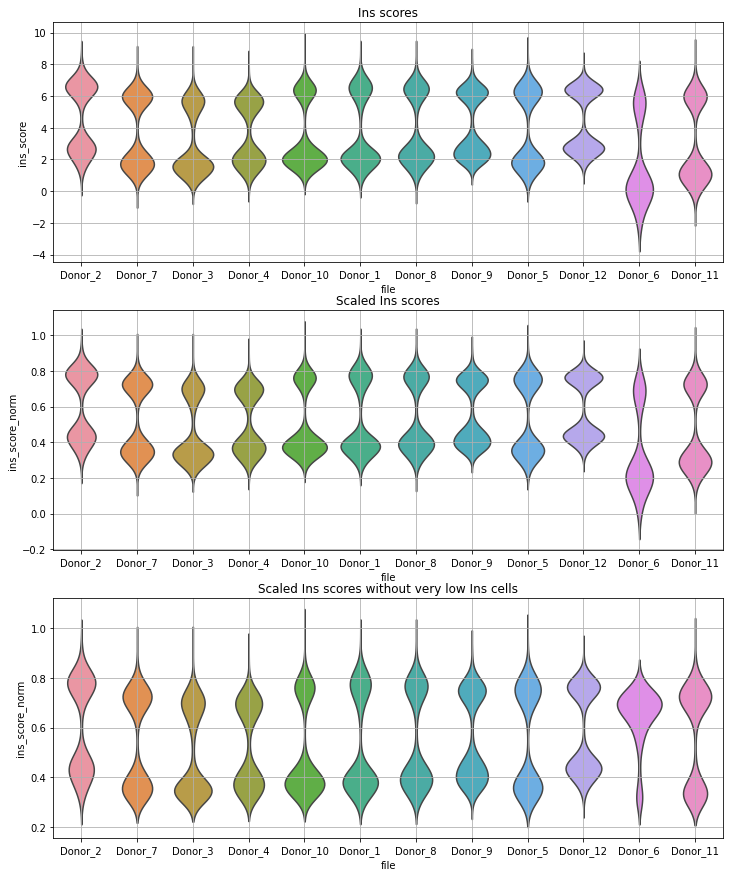

In [26]:
#sc.pl.violin(adata_rawnorm, keys=['ins_score'], groupby='file', stripplot=False, jitter=True)
ins_scores = adata_rawnorm.obs[['ins_score','file']]
ins_scores['ins_score_norm'] = pp.minmax_scale(ins_scores.ins_score)
rcParams['figure.figsize'] = (12, 15)
fig,axs = plt.subplots(3, 1)
sb.violinplot(x='file', y='ins_score', data=ins_scores,inner=None,ax=axs[0])
axs[0].title.set_text('Ins scores')
axs[0].grid()
sb.violinplot(x='file',y='ins_score_norm',data=ins_scores,inner=None,ax=axs[1])
axs[1].title.set_text('Scaled Ins scores')
axs[1].grid()
sb.violinplot(x='file',y='ins_score_norm',data=ins_scores[ins_scores.ins_score_norm>0.3],inner=None,ax=axs[2])
axs[2].title.set_text('Scaled Ins scores without very low Ins cells')
axs[2].grid()

In [27]:
# Find ins high cells
# Use different thresholds across files as there might be different ambient counts (or other effects), 
# thus shifting distributions up a bit
file_thresholds = {'Donor_1': 0.55, 'Donor_2': 0.6, 'Donor_3': 0.5, 'Donor_4': 0.52, 'Donor_5': 0.53, 'Donor_6': 0.4, 'Donor_7': 0.55, 'Donor_8': 0.58, 'Donor_9': 0.59, 'Donor_10': 0.59, 'Donor_11': 0.52, 'Donor_12': 0.6}
adata_rawnorm.obs['ins_high'] = ins_scores.apply(lambda x: x.ins_score_norm > file_thresholds[x.file], axis=1)
print('Proportion of ins high across samples:')
adata_rawnorm.obs[['file', 'ins_high']].groupby('file').ins_high.value_counts(normalize=True, sort=False)

Proportion of ins high across samples:


file      ins_high
Donor_2   False       0.496144
          True        0.503856
Donor_7   False       0.551889
          True        0.448111
Donor_3   False       0.632391
          True        0.367609
Donor_4   False       0.558108
          True        0.441892
Donor_10  False       0.685302
          True        0.314698
Donor_1   False       0.617252
          True        0.382748
Donor_8   False       0.611465
          True        0.388535
Donor_9   False       0.576975
          True        0.423025
Donor_5   False       0.538771
          True        0.461229
Donor_12  False       0.545630
          True        0.454370
Donor_6   False       0.706897
          True        0.293103
Donor_11  False       0.614386
          True        0.385614
Name: ins_high, dtype: float64

In [28]:
# Add info about ins high to main adata and save it
adata.obs['ins_score'] = adata_rawnorm.obs['ins_score']
adata.obs['ins_high'] = adata_rawnorm.obs['ins_high']

#### Gcg

In [29]:
genes = ['GCG']
score_name = 'gcg'

In [30]:
# Compute score
sc.tl.score_genes(adata_rawnorm, gene_list=genes, score_name=score_name + '_score',  use_raw=False)

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


/gpfs/scratch/pn25xo/gobi009/gobi009/ipykernel_46699/3077010033.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  scores[score_name + '_score_norm'] = pp.minmax_scale(scores[score_name + '_score'])


gcg


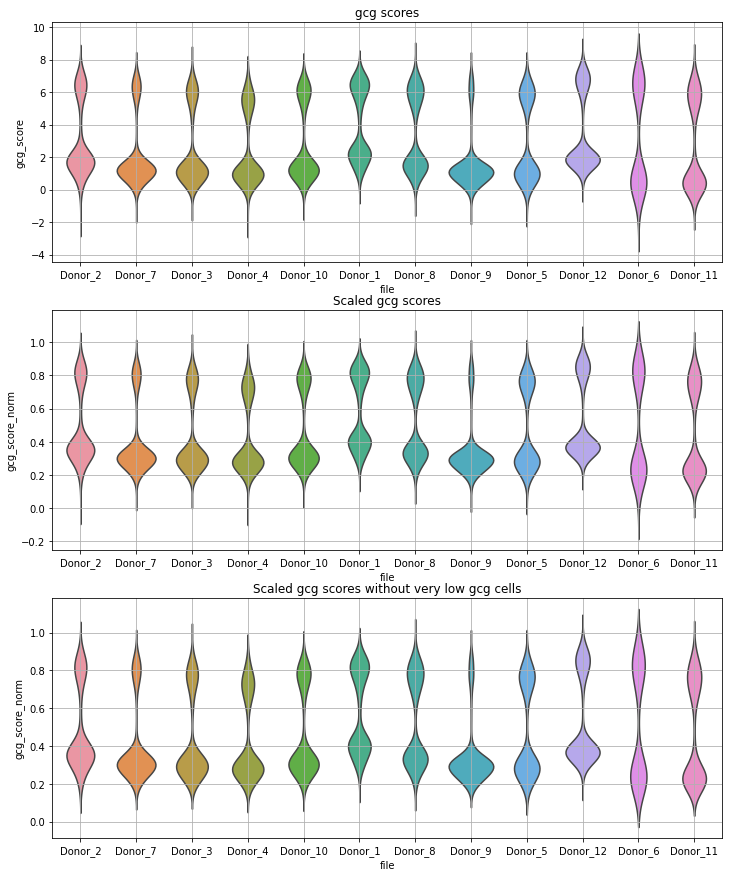

In [31]:
print(score_name)
scores = adata_rawnorm.obs[[score_name + '_score', 'file']]
scores[score_name + '_score_norm'] = pp.minmax_scale(scores[score_name + '_score'])
rcParams['figure.figsize'] = (12, 15)
fig, axs = plt.subplots(3, 1)
sb.violinplot(x='file', y=score_name + '_score', data=scores, inner=None, ax=axs[0])
axs[0].title.set_text(score_name + ' scores')
axs[0].grid()
sb.violinplot(x='file', y=score_name + '_score_norm', data=scores, inner=None, ax=axs[1])
axs[1].title.set_text('Scaled ' + score_name +' scores')
axs[1].grid()
sb.violinplot(x='file', y=score_name + '_score_norm', data=scores[scores[score_name + '_score_norm'] > 0.15], inner=None, ax=axs[2])
axs[2].title.set_text('Scaled ' + score_name + ' scores without very low ' + score_name + ' cells')
axs[2].grid()

In [32]:
# Find score high cells
# Use different thresholds across files as there might be different ambient counts (or other effects), 
# thus shifting distributions up a bit
file_thresholds = {'Donor_1': 0.58, 'Donor_2': 0.55, 'Donor_3': 0.5, 'Donor_4': 0.49, 'Donor_5': 0.5, 'Donor_6': 0.5, 'Donor_7': 0.5, 'Donor_8': 0.53, 'Donor_9': 0.5, 'Donor_10': 0.5, 'Donor_11': 0.49, 'Donor_12': 0.5}
adata_rawnorm.obs[score_name + '_high'] = scores.apply(lambda x: x[score_name + '_score_norm'] > file_thresholds[x.file], axis=1)
print('Proportion of ' + score_name + ' high across samples:')
adata_rawnorm.obs[['file', score_name + '_high']].groupby('file')[score_name + '_high'].value_counts(normalize=True, sort=False)

Proportion of gcg high across samples:


file      gcg_high
Donor_2   False       0.685090
          True        0.314910
Donor_7   False       0.788717
          True        0.211283
Donor_3   False       0.691003
          True        0.308997
Donor_4   False       0.656081
          True        0.343919
Donor_10  False       0.657349
          True        0.342651
Donor_1   False       0.526518
          True        0.473482
Donor_8   False       0.547063
          True        0.452937
Donor_9   False       0.871783
          True        0.128217
Donor_5   False       0.594159
          True        0.405841
Donor_12  False       0.641894
          True        0.358106
Donor_6   False       0.554598
          True        0.445402
Donor_11  False       0.572201
          True        0.427799
Name: gcg_high, dtype: float64

In [33]:
# Add info about score high to main adata and save it
adata.obs[score_name + '_score'] = adata_rawnorm.obs[score_name + '_score']
adata.obs[score_name + '_high'] = adata_rawnorm.obs[score_name + '_high']

#### SSt

In [34]:
genes = ['SST']
score_name = 'sst'

In [35]:
# Compute score
sc.tl.score_genes(adata_rawnorm, gene_list=genes, score_name=score_name + '_score', use_raw=False)

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


/gpfs/scratch/pn25xo/gobi009/gobi009/ipykernel_46699/168590077.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  scores[score_name + '_score_norm'] = pp.minmax_scale(scores[score_name + '_score'])


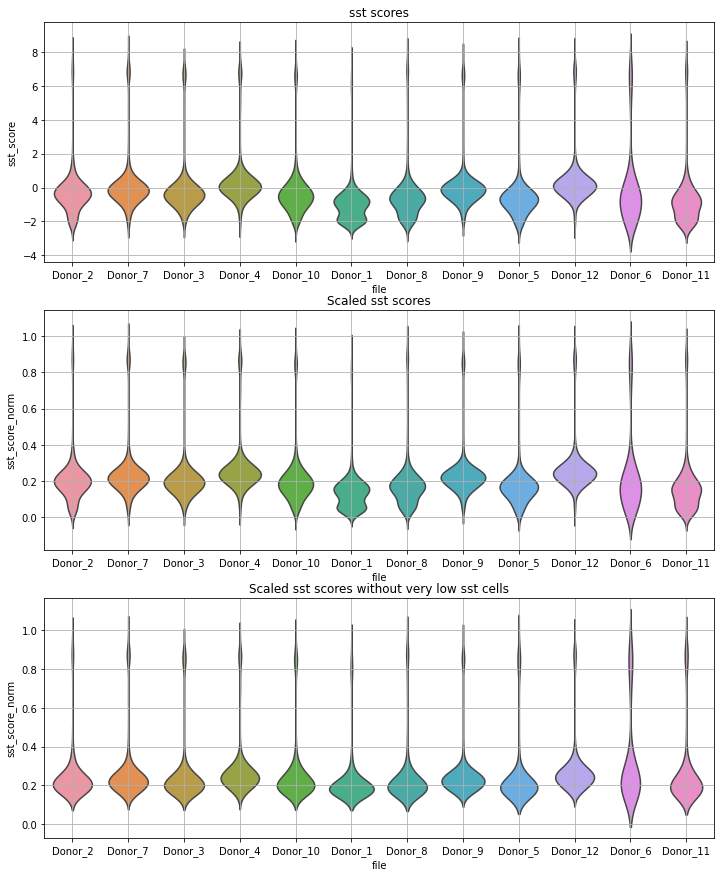

In [36]:
scores = adata_rawnorm.obs[[score_name + '_score','file']]
scores[score_name + '_score_norm'] = pp.minmax_scale(scores[score_name + '_score'])
rcParams['figure.figsize'] = (12, 15)
fig,axs = plt.subplots(3, 1)
sb.violinplot(x='file', y=score_name + '_score', data=scores, inner=None, ax=axs[0])
axs[0].title.set_text(score_name + ' scores')
axs[0].grid()
sb.violinplot(x='file', y=score_name + '_score_norm', data=scores, inner=None, ax=axs[1])
axs[1].title.set_text('Scaled ' + score_name + ' scores')
axs[1].grid()
sb.violinplot(x='file', y=score_name + '_score_norm', data=scores[scores[score_name + '_score_norm'] > 0.15], inner=None, ax=axs[2])
axs[2].title.set_text('Scaled ' + score_name + ' scores without very low ' + score_name + ' cells')
axs[2].grid()

In [37]:
# Find score high cells
# Use different thresholds across files as there might be different ambient counts (or other effects), 
# thus shifting distributions up a bit
file_thresholds = {'Donor_1': 0.5, 'Donor_2': 0.5, 'Donor_3': 0.5, 'Donor_4': 0.5, 'Donor_5': 0.5, 'Donor_6': 0.5, 'Donor_7': 0.5, 'Donor_8': 0.5, 'Donor_9': 0.5, 'Donor_10': 0.5, 'Donor_11': 0.5, 'Donor_12': 0.5}
adata_rawnorm.obs[score_name + '_high'] = scores.apply(lambda x: x[score_name + '_score_norm'] > file_thresholds[x.file], axis=1)
print('Proportion of ' + score_name + ' high across samples:')
adata_rawnorm.obs[['file',score_name + '_high']].groupby('file')[score_name + '_high'].value_counts(normalize=True, sort=False)

Proportion of sst high across samples:


file      sst_high
Donor_2   False       0.964010
          True        0.035990
Donor_7   False       0.940926
          True        0.059074
Donor_3   False       0.941388
          True        0.058612
Donor_4   False       0.933784
          True        0.066216
Donor_10  False       0.951758
          True        0.048242
Donor_1   False       0.975080
          True        0.024920
Donor_8   False       0.963199
          True        0.036801
Donor_9   False       0.957111
          True        0.042889
Donor_5   False       0.951662
          True        0.048338
Donor_12  False       0.948017
          True        0.051983
Donor_6   False       0.893678
          True        0.106322
Donor_11  False       0.955652
          True        0.044348
Name: sst_high, dtype: float64

In [38]:
# Add info about score high to main adata and save it
adata.obs[score_name + '_score'] = adata_rawnorm.obs[score_name + '_score']
adata.obs[score_name + '_high'] = adata_rawnorm.obs[score_name + '_high']

#### Ppy

In [39]:
genes = ['PPY']
score_name = 'ppy'

In [40]:
# Compute score
sc.tl.score_genes(adata_rawnorm, gene_list=genes, score_name=score_name + '_score', use_raw=False)

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


/gpfs/scratch/pn25xo/gobi009/gobi009/ipykernel_46699/1089406135.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  scores[score_name + '_score_norm'] = pp.minmax_scale(scores[score_name + '_score'])


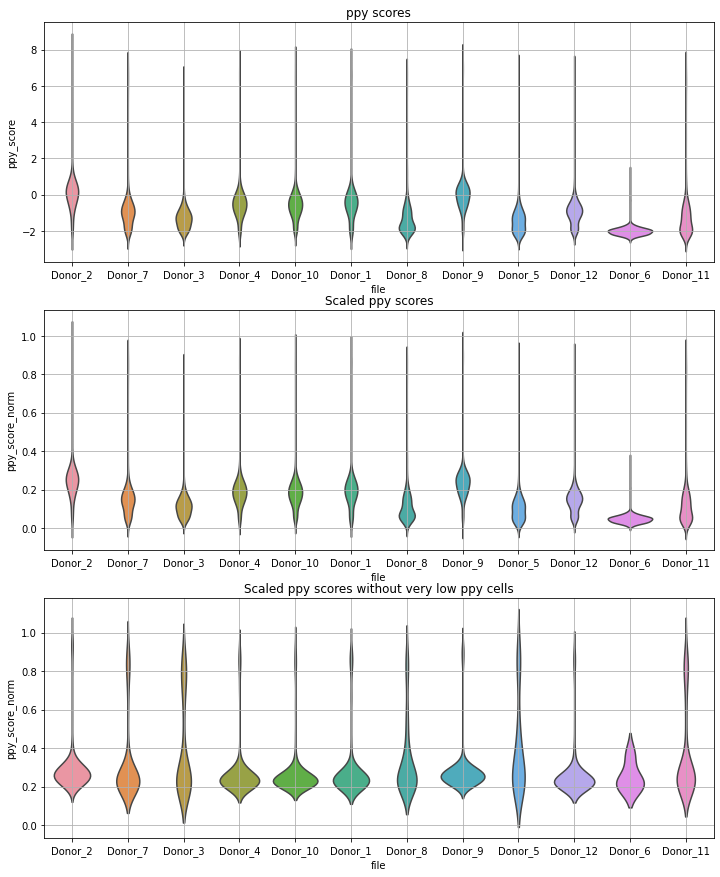

In [41]:
scores = adata_rawnorm.obs[[score_name + '_score','file']]
scores[score_name + '_score_norm'] = pp.minmax_scale(scores[score_name + '_score'])
rcParams['figure.figsize'] = (12, 15)
fig,axs = plt.subplots(3, 1)
sb.violinplot(x='file', y=score_name + '_score', data=scores, inner=None, ax=axs[0])
axs[0].title.set_text(score_name + ' scores')
axs[0].grid()
sb.violinplot(x='file', y=score_name + '_score_norm', data=scores, inner=None, ax=axs[1])
axs[1].title.set_text('Scaled ' + score_name + ' scores')
axs[1].grid()
sb.violinplot(x='file', y=score_name + '_score_norm', data=scores[scores[score_name + '_score_norm'] > 0.2], inner=None, ax=axs[2])
axs[2].title.set_text('Scaled ' + score_name + ' scores without very low ' + score_name + ' cells')
axs[2].grid()

In [42]:
# Find score high cells
# Use different thresholds across files as there might be different ambient counts (or other effects), 
# thus shifting distributions up a bit
file_thresholds = {'Donor_1': 0.6, 'Donor_2': 0.6, 'Donor_3': 0.6, 'Donor_4': 0.6, 'Donor_5': 0.6, 'Donor_6': 0.6, 'Donor_7': 0.6, 'Donor_8': 0.6, 'Donor_9': 0.6, 'Donor_10': 0.6, 'Donor_11': 0.6, 'Donor_12': 0.6}

adata_rawnorm.obs[score_name + '_high'] = scores.apply(lambda x: x[score_name + '_score_norm'] > file_thresholds[x.file], axis=1)
print('Proportion of ' + score_name + ' high across samples:')
adata_rawnorm.obs[['file', score_name + '_high']].groupby('file')[score_name + '_high'].value_counts(normalize=True, sort=False)

Proportion of ppy high across samples:


file      ppy_high
Donor_2   False       0.962725
          True        0.037275
Donor_7   False       0.972858
          True        0.027142
Donor_3   False       0.982005
          True        0.017995
Donor_4   False       0.974324
          True        0.025676
Donor_10  False       0.981966
          True        0.018034
Donor_1   False       0.960383
          True        0.039617
Donor_8   False       0.987261
          True        0.012739
Donor_9   False       0.968849
          True        0.031151
Donor_5   False       0.987915
          True        0.012085
Donor_12  False       0.993069
          True        0.006931
Donor_6   False       1.000000
Donor_11  False       0.974581
          True        0.025419
Name: ppy_high, dtype: float64

In [43]:
# Add info about score high to main adata and save it
adata.obs[score_name + '_score'] = adata_rawnorm.obs[score_name + '_score']
adata.obs[score_name + '_high'] = adata_rawnorm.obs[score_name + '_high']

#### Ghrl

In [44]:
genes=['GHRL']
score_name='ghrl'

In [45]:
# Compute score
sc.tl.score_genes(adata_rawnorm, gene_list=genes, score_name=score_name + '_score',  use_raw=False)

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


/gpfs/scratch/pn25xo/gobi009/gobi009/ipykernel_46699/4016006569.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  scores[score_name + '_score_norm'] = pp.minmax_scale(scores[score_name + '_score'])


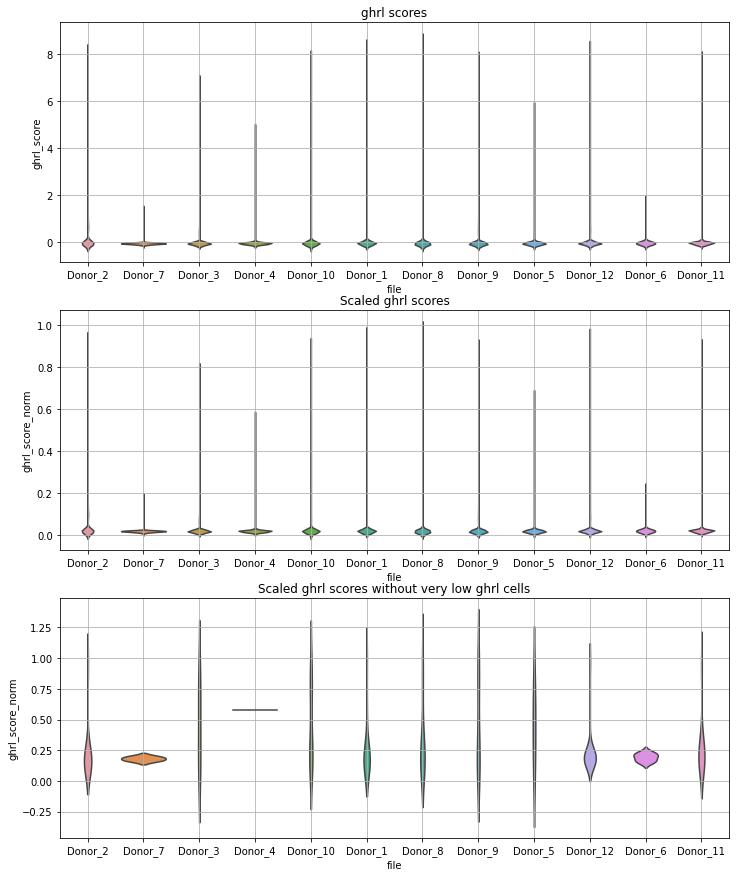

In [46]:
scores = adata_rawnorm.obs[[score_name + '_score', 'file']]
scores[score_name + '_score_norm'] = pp.minmax_scale(scores[score_name + '_score'])
rcParams['figure.figsize'] = (12, 15)
fig,axs = plt.subplots(3, 1)
sb.violinplot(x='file', y=score_name + '_score', data=scores, inner=None, ax=axs[0])
axs[0].title.set_text(score_name + ' scores')
axs[0].grid()
sb.violinplot(x='file', y=score_name + '_score_norm', data=scores, inner=None, ax=axs[1])
axs[1].title.set_text('Scaled ' + score_name + ' scores')
axs[1].grid()
sb.violinplot(x='file', y=score_name + '_score_norm', data=scores[scores[score_name + '_score_norm'] > 0.15], inner=None, ax=axs[2])
axs[2].title.set_text('Scaled ' + score_name + ' scores without very low ' + score_name + ' cells')
axs[2].grid()

In [47]:
# Find score high cells
# Use different thresholds across files as there might be different ambient counts (or other effects), 
# thus shifting distributions up a bit
file_thresholds = {'Donor_1': 0.55, 'Donor_2': 0.5, 'Donor_3': 0.6, 'Donor_4': 0.75, 'Donor_5': 0.75, 'Donor_6': 0.3, 'Donor_7': 0.25, 'Donor_8': 0.6, 'Donor_9': 0.6, 'Donor_10': 0.5, 'Donor_11': 0.6, 'Donor_12': 0.5}
adata_rawnorm.obs[score_name + '_high'] = scores.apply(lambda x: x[score_name + '_score_norm'] > file_thresholds[x.file], axis=1)
print('Proportion of '+score_name+' high across samples:')
adata_rawnorm.obs[['file', score_name + '_high']].groupby('file')[score_name + '_high'].value_counts(normalize=True, sort=False)

Proportion of ghrl high across samples:


file      ghrl_high
Donor_2   False        0.998715
          True         0.001285
Donor_7   False        1.000000
Donor_3   False        0.998972
          True         0.001028
Donor_4   False        1.000000
Donor_10  False        0.997746
          True         0.002254
Donor_1   False        0.998722
          True         0.001278
Donor_8   False        0.998585
          True         0.001415
Donor_9   False        0.998646
          True         0.001354
Donor_5   False        1.000000
Donor_12  False        0.999615
          True         0.000385
Donor_6   False        1.000000
Donor_11  False        0.999459
          True         0.000541
Name: ghrl_high, dtype: float64

In [48]:
# Add info about score high to main adata and save it
adata.obs[score_name + '_score'] = adata_rawnorm.obs[score_name + '_score']
adata.obs[score_name + '_high'] = adata_rawnorm.obs[score_name + '_high']

#### Save

In [49]:
# h.save_h5ad(adata, shared_folder+"data_annotated.h5ad",unique_id2=UID2)
# adata.write(shared_folder + 'data_annotated.h5ad')
pickle.dump(adata, open(shared_folder + 'data_annotated.pkl', 'wb'))

## All cell types

## Clustering

#### Leiden clustering on log transformed data.

In [50]:
adata

AnnData object with n_obs × n_vars = 19280 × 15252
    obs: 'file', 'n_counts', 'n_genes', 'mt_frac', 'n_counts_filter', 'n_genes_filter', 'mt_frac_filter', 'doublet_score', 'doublet', 'doublet_score_filter', 'size_factors', 'phase_cyclone', 's_cyclone', 'g2m_cyclone', 'g1_cyclone', 'ins_score', 'ins_high', 'gcg_score', 'gcg_high', 'sst_score', 'sst_high', 'ppy_score', 'ppy_high', 'ghrl_score', 'ghrl_high'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'EID'
    uns: 'doublet_score_filter_colors', 'file_colors', 'hvg', 'mt_frac_filter_colors', 'n_counts_filter_colors', 'n_genes_filter_colors', 'pca', 'neighbors', 'umap', 'phase_cyclone_colors'
    obsm: 'X_pca', 'X_umap', 'X_umap_scl'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [51]:
sc.tl.leiden(adata, resolution=0.4)

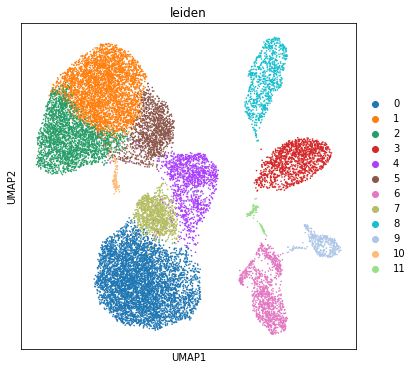

In [52]:
rcParams['figure.figsize'] = (6, 6)
sc.pl.umap(adata, color=['leiden'], size=10, use_raw=False)

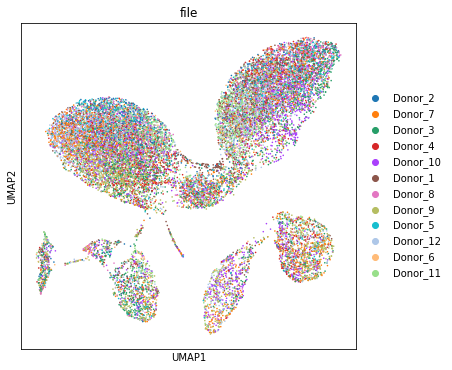

In [53]:
#del adata_scl.uns['sex_colors']
rcParams['figure.figsize'] = (6, 6)
random_indices = np.random.permutation(list(range(adata_scl.shape[0])))
#sc.pl.umap(adata_scl[random_indices, :], color=['file', 'phase_cyclone'], size=10, use_raw=False, wspace=0.3, sort_order=False)
sc.pl.umap(adata_scl[random_indices, :], color=['file'], size=10, use_raw=False, wspace=0.3, sort_order=False)

In [54]:
# Clustering resolution
res = .25

In [55]:
# Cluster scaled data
sc.tl.leiden(adata_scl, resolution=res, key_added='leiden_scaled_r' + str(res), directed=True, use_weights=True)

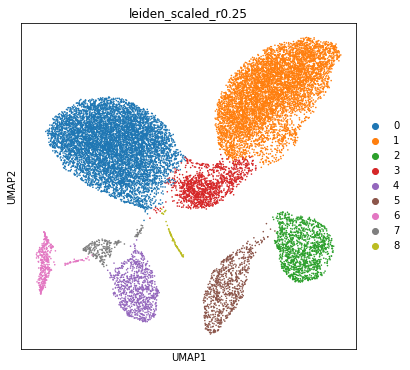

In [56]:
# Compare UMAPs and clusters on scaled data
rcParams['figure.figsize'] = (6, 6)
sc.pl.umap(adata_scl, color=['leiden_scaled_r' + str(res)], size=10, use_raw=False)

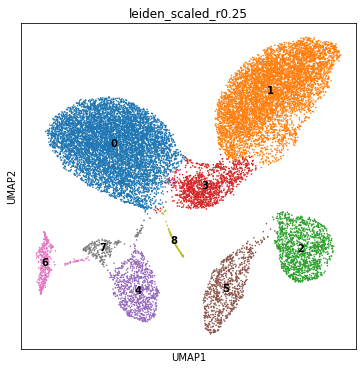

In [57]:
# Compare UMAPs and clusters on scaled data
rcParams['figure.figsize'] = (6, 6)
sc.pl.umap(adata_scl, color=['leiden_scaled_r' + str(res)], size=10, use_raw=False, legend_loc='on data')

#C: Umaps and clusterings on z-scaled data and non-z-scaled data perform similarly. z-scaled data will be used for consistency with other analysed studies.

## Cell type annotation

In [58]:
# Normalise raw data for plotting and cell type scoring
adata_raw = adata_scl.raw.to_adata().copy()
sc.pp.normalize_total(adata_raw, target_sum=1e4, exclude_highly_expressed=True, inplace=False)
sc.pp.log1p(adata_raw)
adata_rawnormalised = adata_scl.copy()
adata_rawnormalised.raw = adata_raw
del adata_raw

In [59]:
# Markers data
marker_data = pd.read_excel('/dss/dsshome1/lxc07/gobi009/hafner/code/marker_genes_collection.xlsx',
             sheet_name='Collection table')

In [60]:
# Load orthologues so that mice markers can be also checked out
orthologues = pd.read_table('/dss/dsshome1/lxc07/gobi009/hafner/code/orthologues_ORGmus_musculus_ORG2homo_sapiens_V103.tsv')

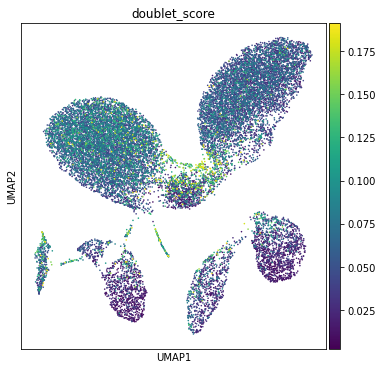

In [61]:
# Plot doublet score
sc.pl.umap(adata_rawnormalised, color='doublet_score', size=10, use_raw=True)

C: It seems that some doublets may be present

('B cell', 'NA')
Missing genes: []


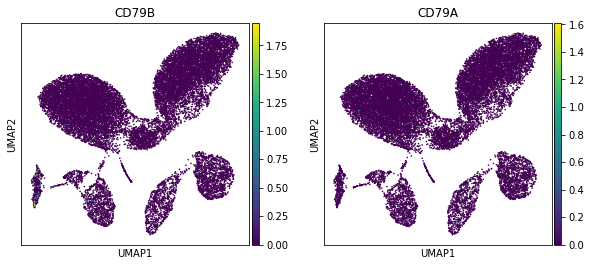

('Schwann cell', 'NA')
Missing genes: ['CMTM5']


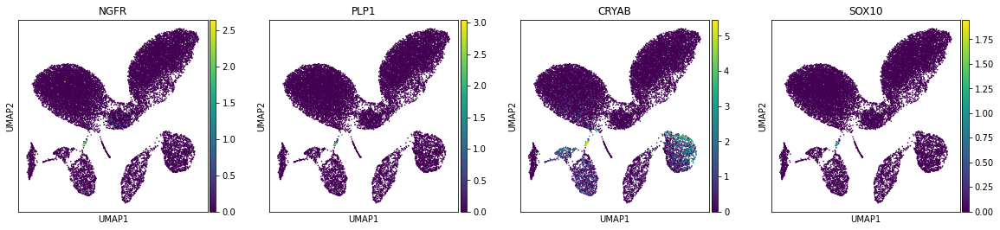

('T cell', 'NA')
Missing genes: ['CD3D']


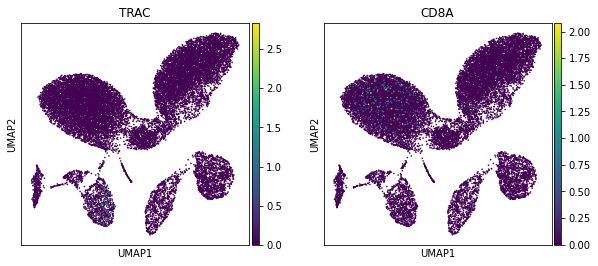

('cytotoxic T cell', 'NA')
Missing genes: ['CD8B']


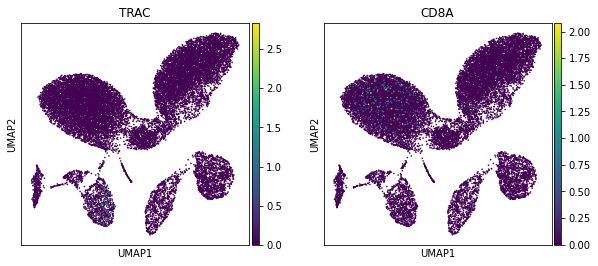

('dendritic cell', 'NA')
Missing genes: ['AC136475.9']


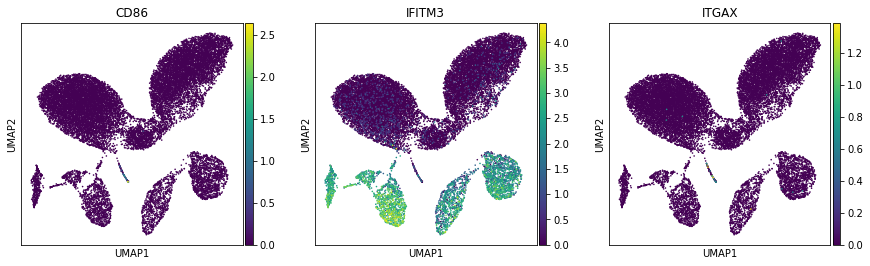

('endothelial cell', 'NA')
Missing genes: []


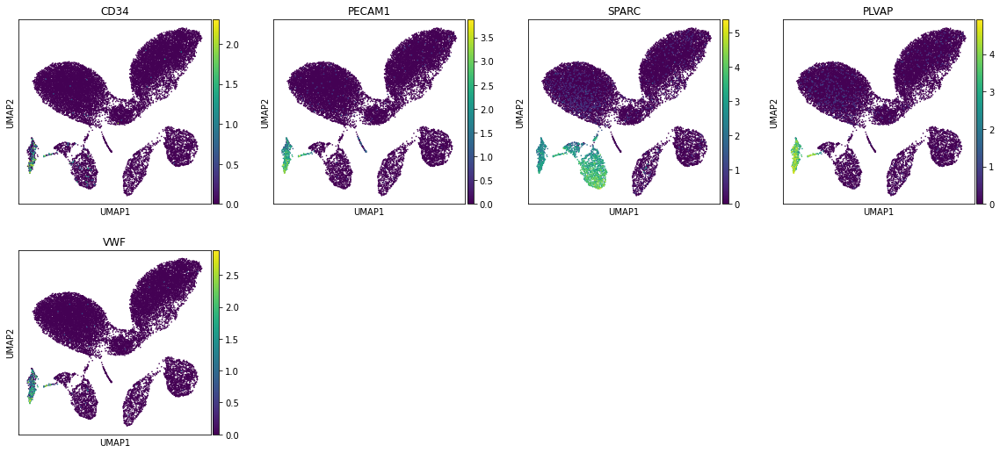

('fibroblast', 'NA')
Missing genes: []


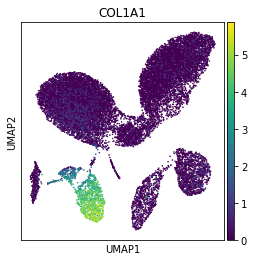

('leukocyte', 'NA')
Missing genes: []


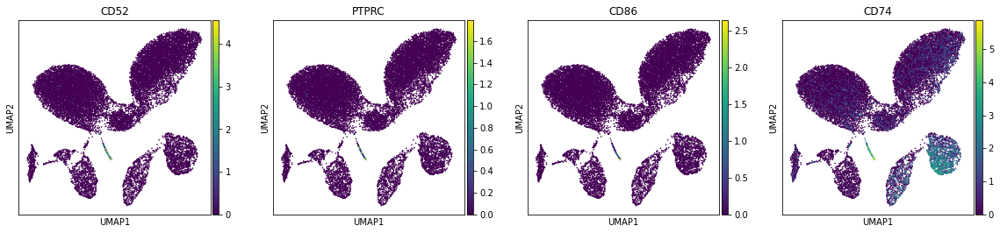

('macrophage', 'NA')
Missing genes: ['ADGRE1']


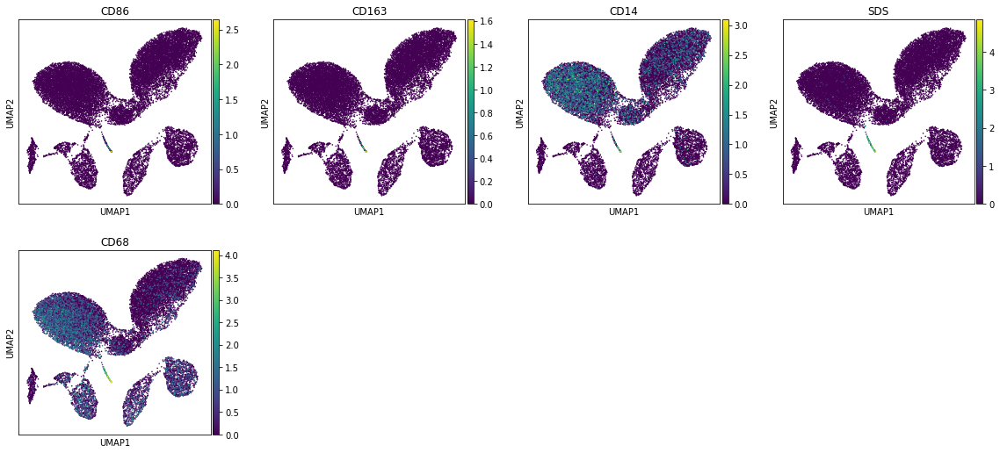

('mast cell', 'NA')
Missing genes: ['CPA3']


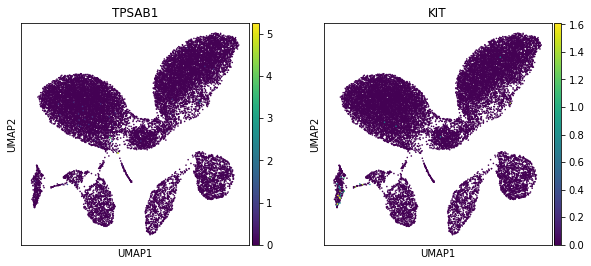

('pancreatic A cell', 'NA')
Missing genes: []


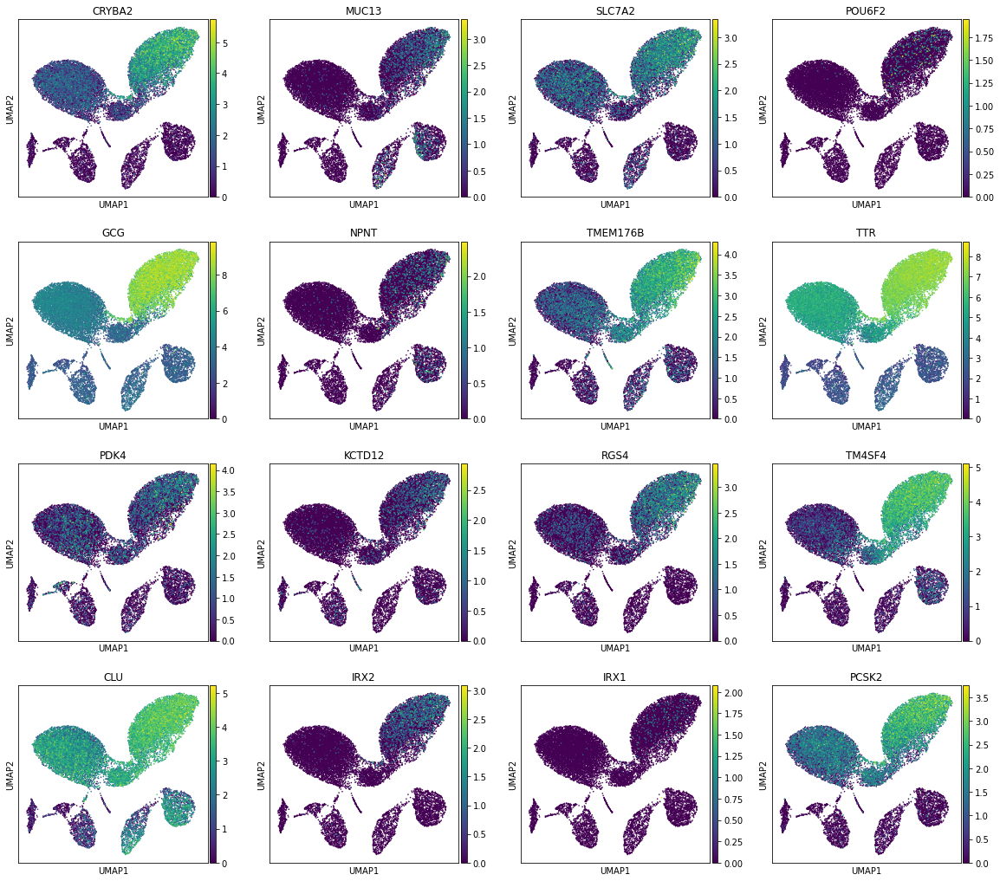

('pancreatic D cell', 'NA')
Missing genes: ['NEUROG3']


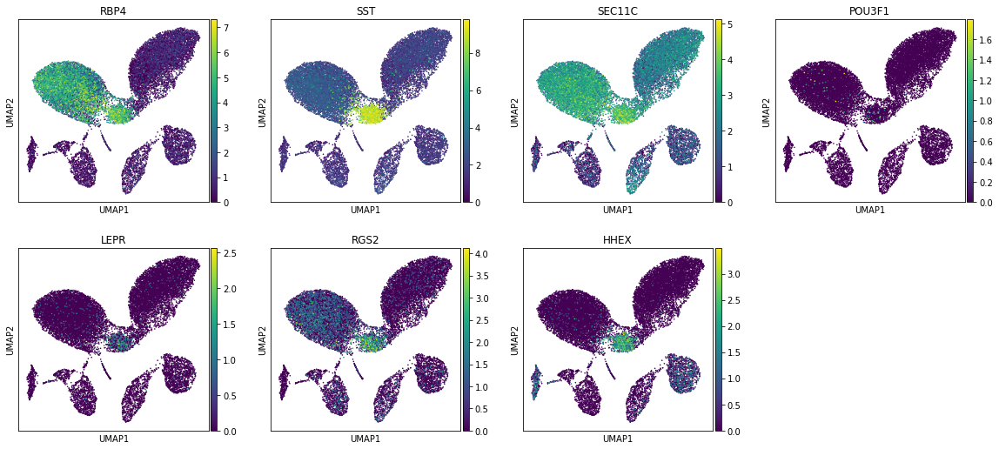

('pancreatic PP cell', 'NA')
Missing genes: []


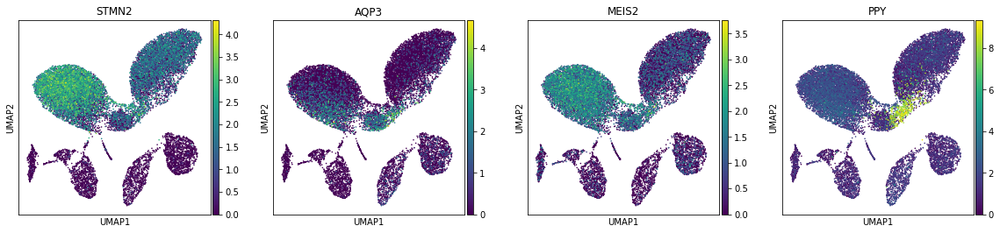

('pancreatic acinar cell', 'NA')
Missing genes: ['RBPJL']


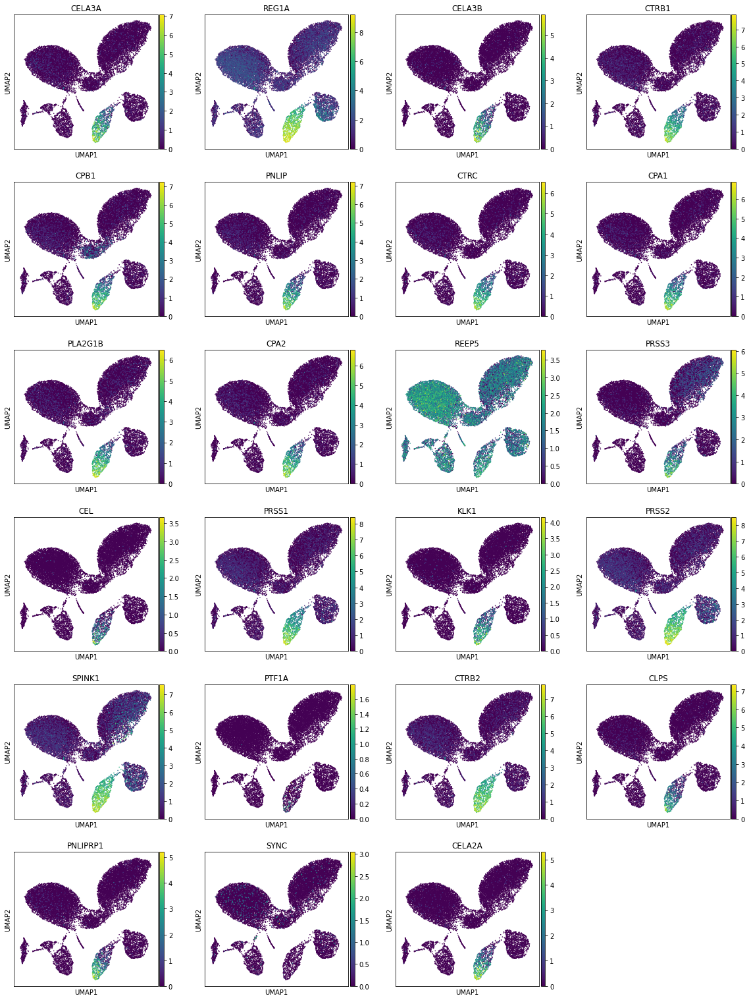

('pancreatic ductal cell', 'NA')
Missing genes: []


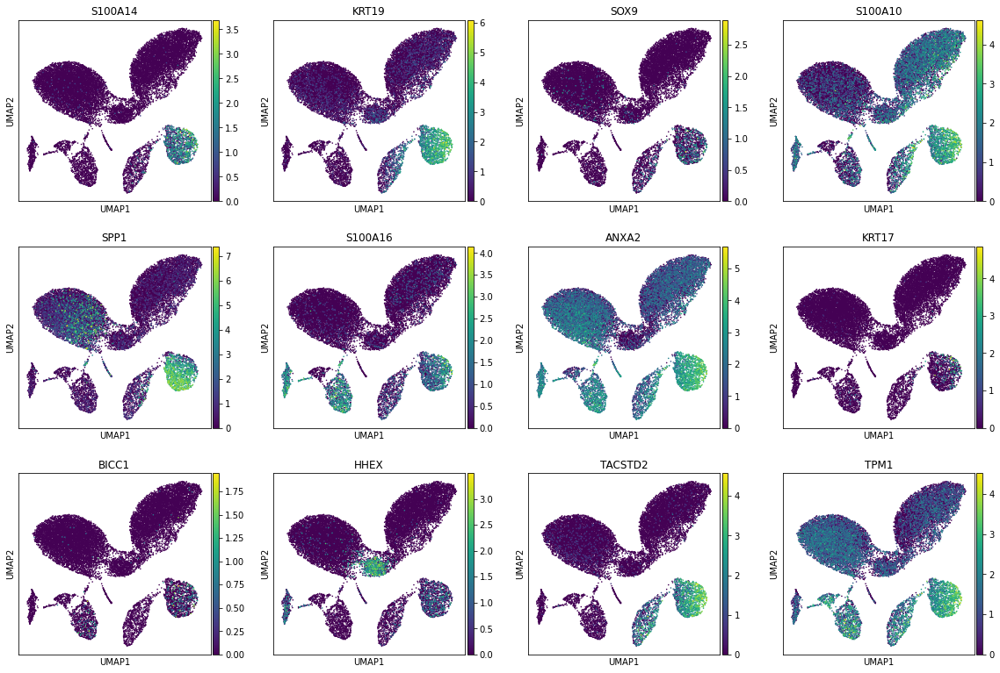

('pancreatic ductal cell', 'mature')
Missing genes: []


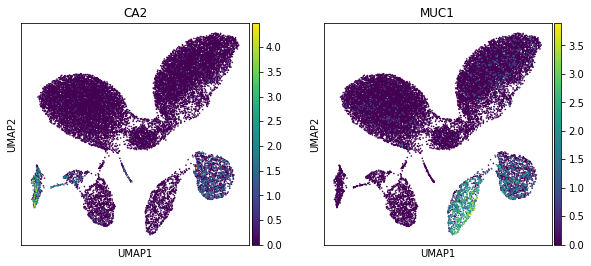

('pancreatic endocrine cell', 'NA')
Missing genes: []


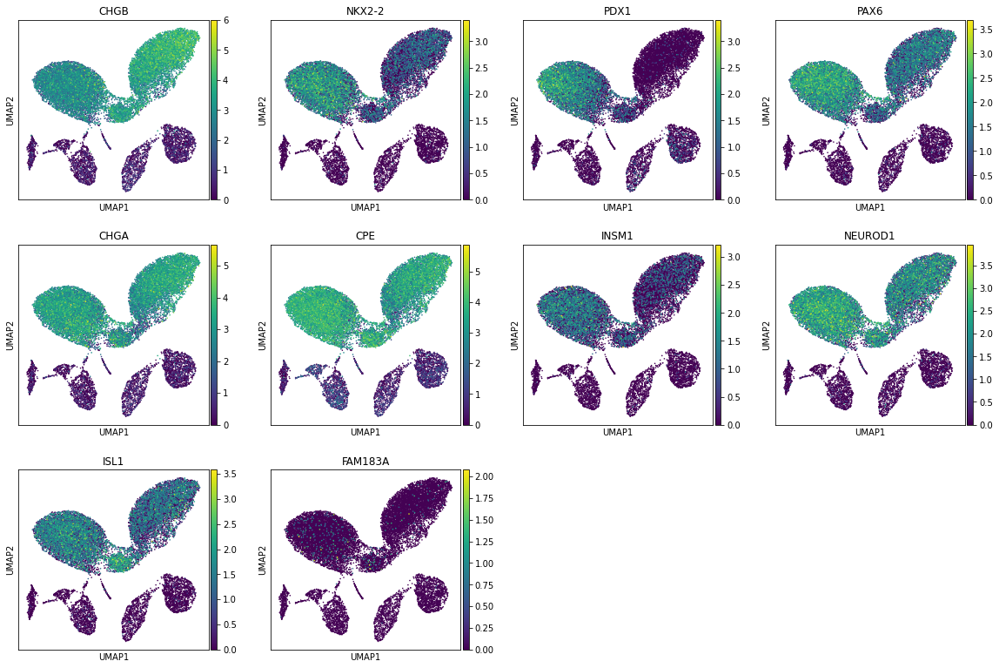

('pancreatic epsilon cell', 'NA')
Missing genes: []


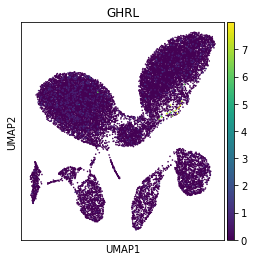

('pancreatic stellate cell', 'NA')
Missing genes: []


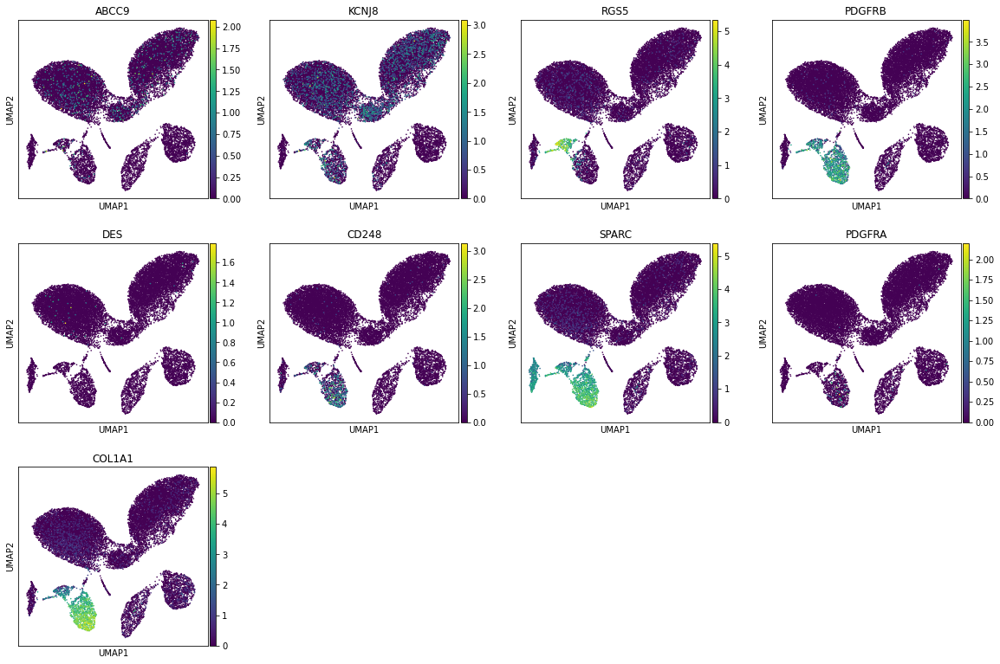

('pancreatic stellate cell', 'activated')
Missing genes: []


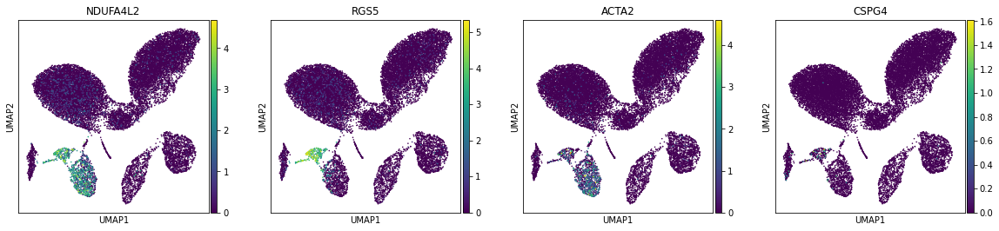

('pancreatic stellate cell', 'quiescent')
Missing genes: []


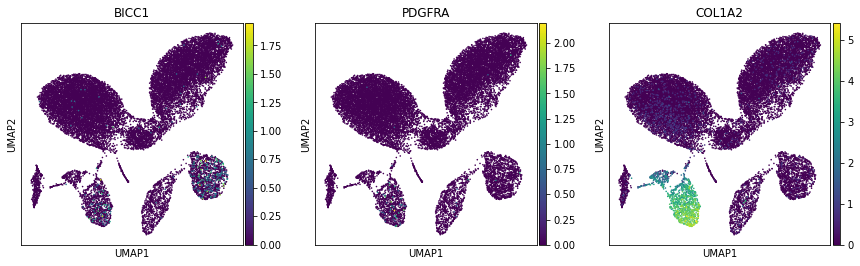

('progenitor cell of endocrine pancreas', 'NA')
Missing genes: []


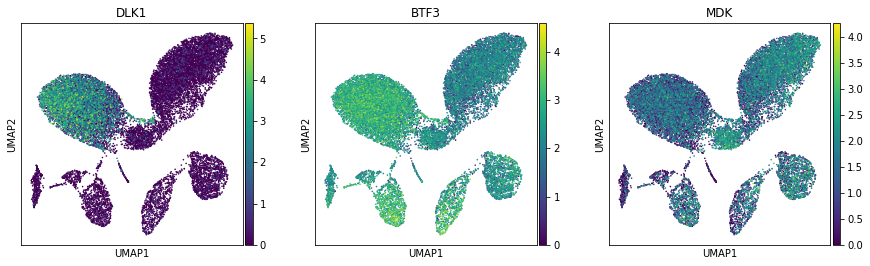

('type B pancreatic cell', 'ER stress')
Missing genes: []


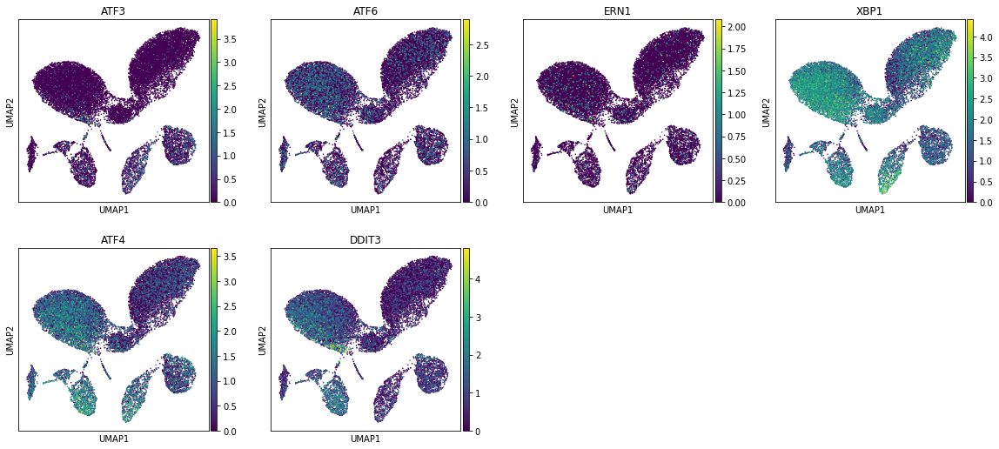

('type B pancreatic cell', 'NA')
Missing genes: []


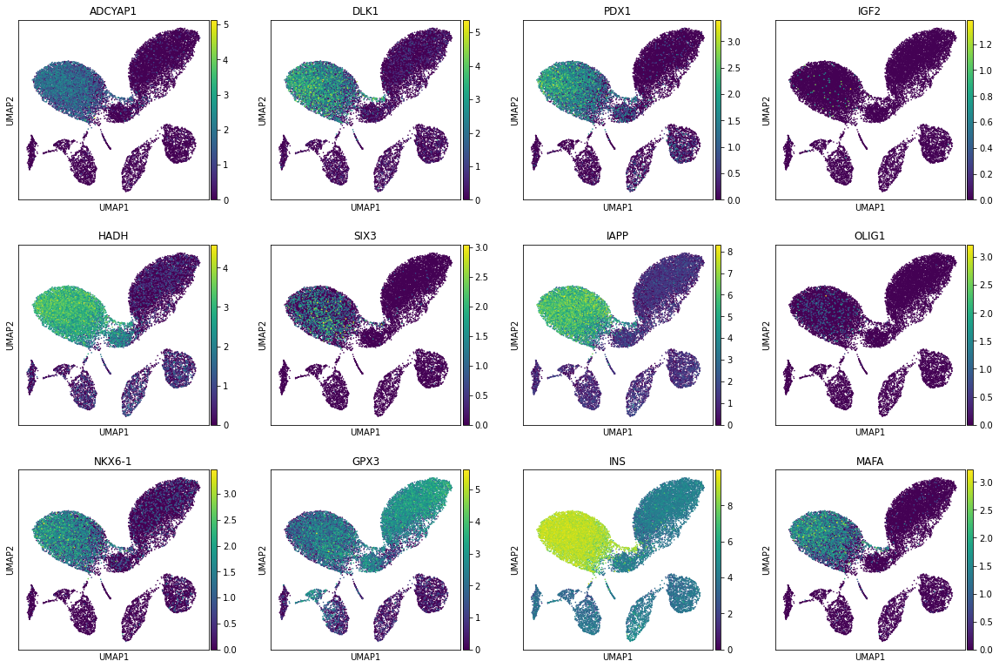

('type B pancreatic cell', 'aging')
Missing genes: []


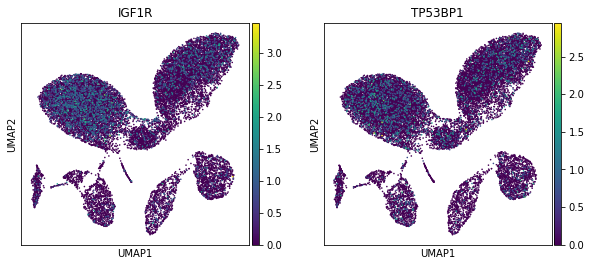

('type B pancreatic cell', 'dedifferentiated')
Missing genes: ['SLC5A10']


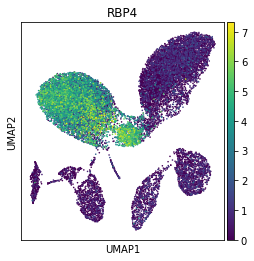

('type B pancreatic cell', 'immature')
Missing genes: []


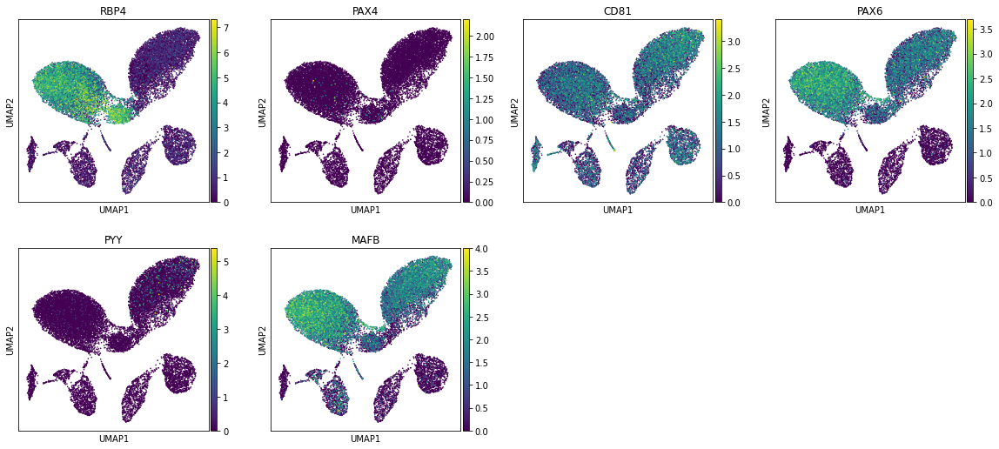

('type B pancreatic cell', 'inflamation')
Missing genes: ['CXCL10']


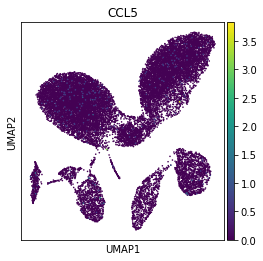

('type B pancreatic cell', 'mature')
Missing genes: []


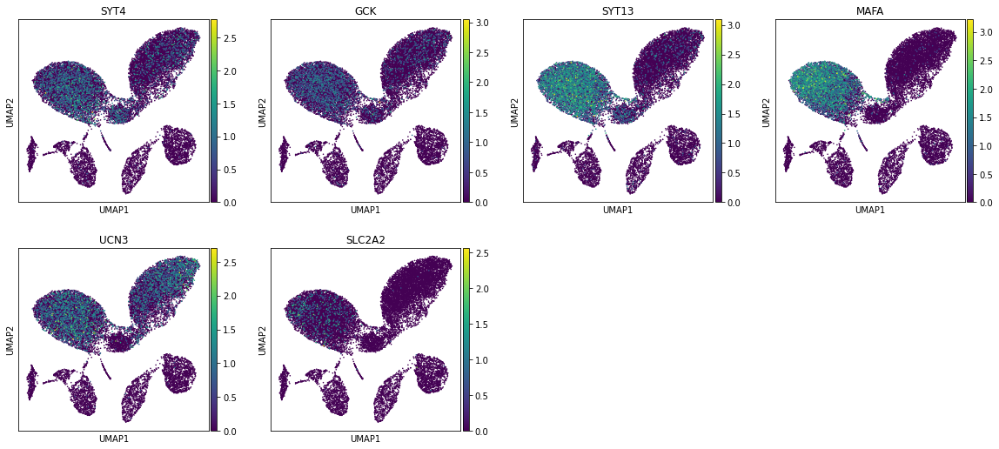

('type B pancreatic cell', 'senescent')
Missing genes: []


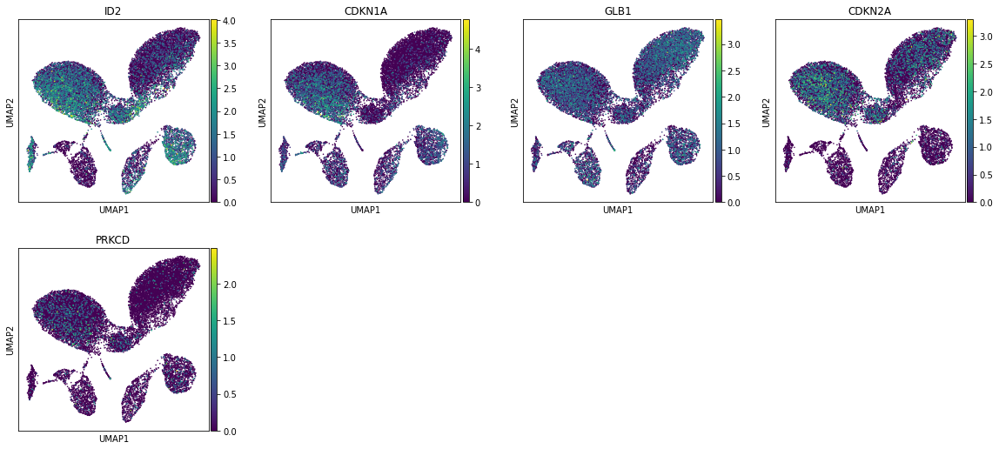

In [62]:
# Plot markers for each cell type
# Fillna as else groupby item iteration does not work well
marker_groups = marker_data.fillna('NA').query('tissue == "pancreas"').groupby(['cell_type', 'subtype'])
for cell_type,data in marker_groups:
    print(cell_type)
    # For mouse subset to markers that worked
    genes_mouse = set(data.query('worked == worked & organism == "Mus musculus"').gene_name) # worked==worked removes nan values
    genes_mouse_orthologues = set(orthologues[orthologues['Gene name'].isin(genes_mouse)]['Human gene name'])
    # For mouse also use just upper case representation
    # But exclude those that are not in adata from the start as they amy not be valid human genes
    genes_mouse_upper = set([gene.upper() for gene in genes_mouse if  gene.upper() in adata.var_names])
    # Human gene markers
    genes_human = set(data.query('organism == "Homo sapiens"').gene_name) 
    # Combination of all markers
    genes = genes_human | genes_mouse_upper | genes_mouse_orthologues
    # Retain genes present in raw var_names
    missing = [gene for gene in genes if gene not in adata.raw.var_names]
    genes = [gene for gene in genes if gene in adata.raw.var_names]
    if len(genes) > 0:
        print('Missing genes:', missing)
        rcParams['figure.figsize'] = (4, 4)
        #sc.pl.umap(adata_rawnormalised, color=['pre_cell_type'],size=10, use_raw=True)
        sc.pl.umap(adata_rawnormalised, color=genes, size=10, use_raw=True)
    else:
        print('No availiable genes (out of:', missing, ')\n')

In [63]:
# Selected markers that seem to be able to distinguish between cell types
# Use only hormone genes for endocrine cells
markers_selection = {
    'schwann': ['SOX10', 'PLP1'],
    'endothelial': ['PECAM1', 'PLVAP'],
    'immune': ['PTPRC'],
    'alpha': ['GCG'], # Also others
    'delta': ['SST', 'HHEX', 'RGS2'],
    'gamma': ['PPY'],
    # Also many other acinar marker genes
    'acinar': ['CELA2A', 'KLK1', 'CPB1', 'PNLIP', 'CPA1', 'CELA3B', 'CPA2', 'PNLIPRP1', 'CEL',  # old
              'CTRB1', 'PRSS2', 'CELA3B', 'REG1A'],
    'ductal': ['S100A14'],# 'KRT19', 'TACSTD2', 'SPP1'], # S100 is old, maybe remove?
    'epsilon': ['GHRL'],
    'stellate_activated': ['RGS5'],
    'stellate_quiescent': ['COL1A2'], # 'PDGFRA',
    'beta': ['INS', 'IAPP'], #Also others
}

### Marker expression scores
Score each cell for marker expression of each cell type. Cells can thus be annotated qith 0 to N cell types. The presence of annotations is then checked for each cluster.

In [64]:
#Score cells for each cell type

# Save score column names 
scores = []
for cell_type, genes in markers_selection.items():
    score_name = cell_type + '_score'
    scores.append(cell_type + '_score')
    sc.tl.score_genes(adata_rawnormalised, gene_list=genes, score_name=score_name, use_raw=True)

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will rai

In [65]:
# Which clusters (column name) to analyse for cell scores
res = 0.25
clusters_col = 'leiden_scaled_r' + str(res)

In [66]:
# Add cluster information to the used adata
adata_rawnormalised.obs[clusters_col] = adata_scl.obs[clusters_col].copy()

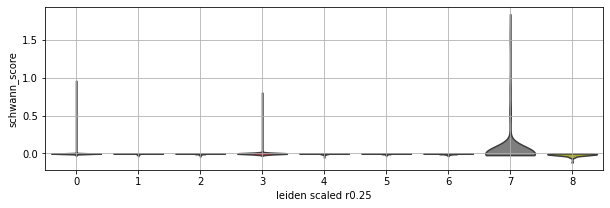

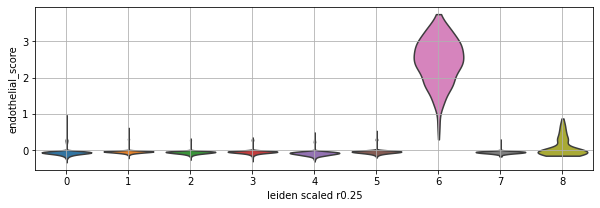

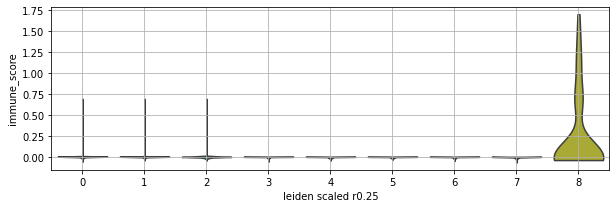

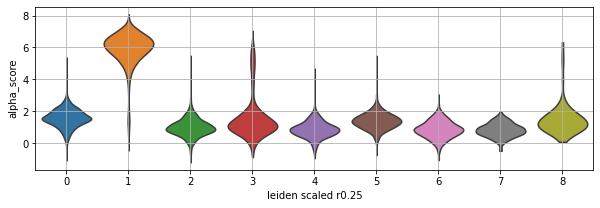

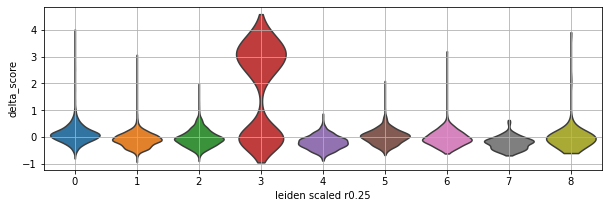

...

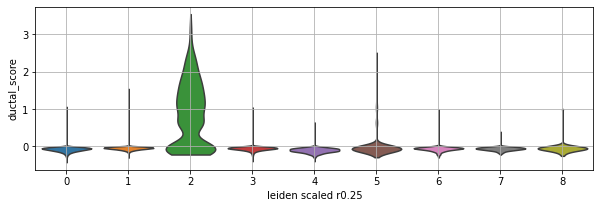

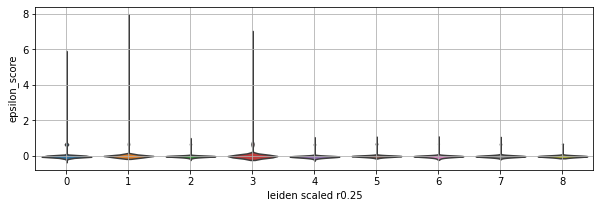

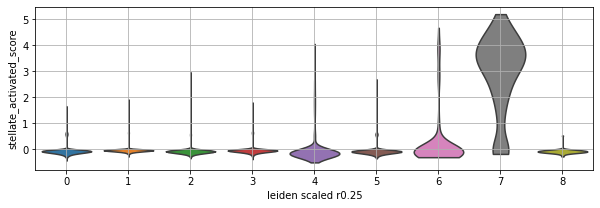

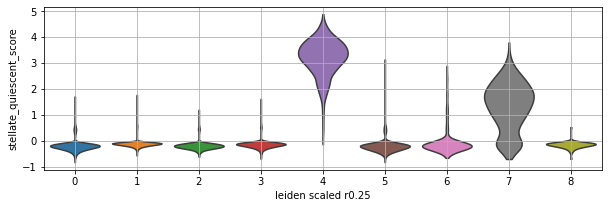

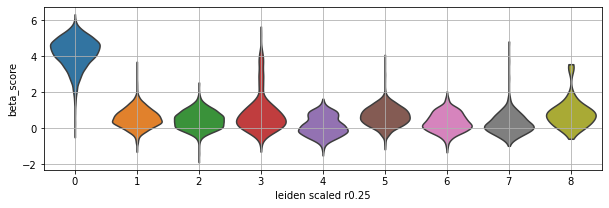

In [67]:
# Plot scores distribution across clusters
rcParams['figure.figsize']=(10,3)
for score in scores:
    fig, ax = plt.subplots()
    sc.pl.violin(adata_rawnormalised, keys=score, groupby=clusters_col, use_raw=True, stripplot=False, ax=ax, show=False)
    ax.grid()

In [68]:
# Scores normalised to interval [0,1] for each cell type - so that they can be more easily compared
scores_df = adata_rawnormalised.obs[scores]
# Do not use normalisation so that it is more comparable to above
# scores_df_norm = pd.DataFrame(pp.minmax_scale(scores_df_norm), columns=scores_df_norm.columns, index=adata_rawnormalised.obs.index)

In [69]:
thresholds_map = {
    'schwann_score': 0.25,
    'endothelial_score': 1,
    'immune_score': 0.5,
    'alpha_score': 3.5,
    'delta_score': 1.7,
    'gamma_score': 4,
    'acinar_score': 0.8,
    'ductal_score': 0.25,
    'epsilon_score': 4,
    'stellate_activated_score': 0.9,
    'stellate_quiescent_score': 0.7,
    'beta_score': 2
}

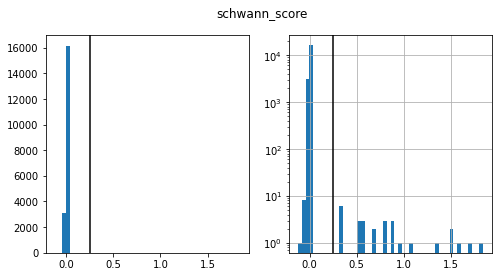

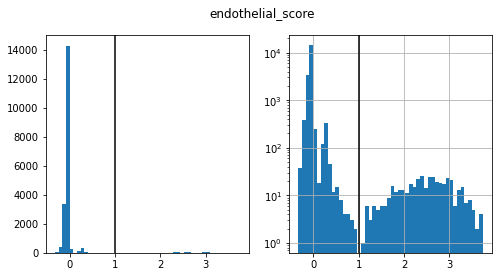

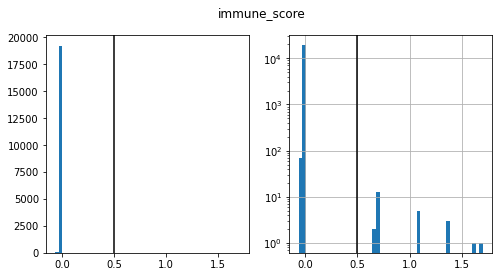

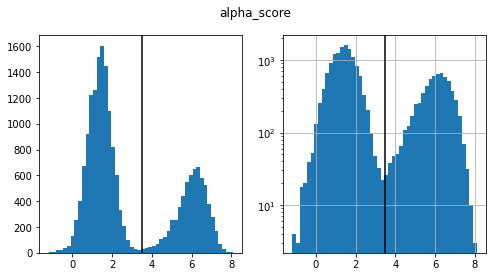

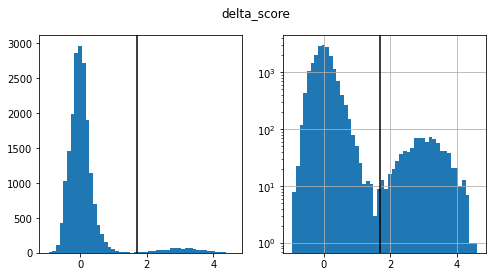

...

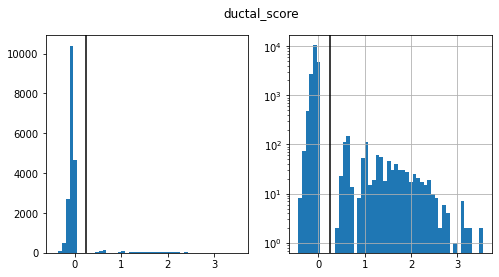

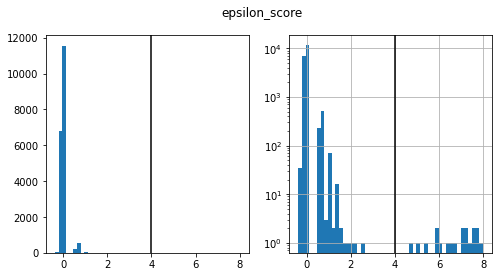

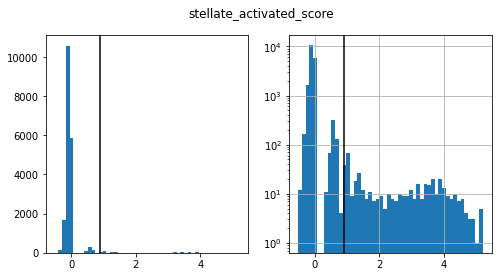

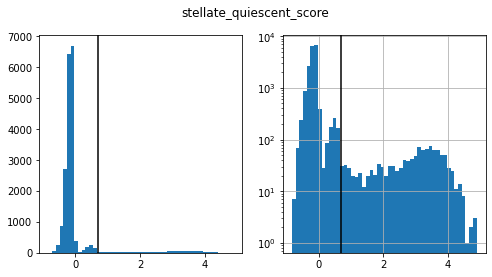

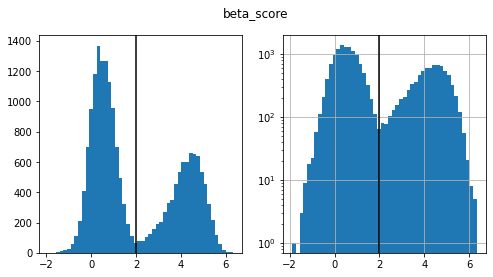

In [70]:
# Distn of scores across all cells to account for different N of cells across clusters
for score in scores_df.columns:
    thr = thresholds_map[score]
    fig, ax = plt.subplots(1, 2, figsize=(8, 4))
    ax[0].hist(scores_df[score], bins=50)
    ax[1].hist(scores_df[score], bins=50)
    fig.suptitle(score)
    ax[1].set_yscale('log')
    ax[1].grid()
    ax[0].axvline(thr, c='k')
    ax[1].axvline(thr, c='k')

In [71]:
# Thresholds for cell type assignemnt based on normalised scores
thresholds = scores_df.columns.map(thresholds_map)

In [72]:
# Assign cell types based on scores to each cell
assignment_df = scores_df >= thresholds
assignment_df.columns = [col.replace('_score', '') for col in scores_df.columns]

In [73]:
# Count of cells per cell type
assignment_df[[col.replace('_score', '') for col in scores_df.columns]].sum()

schwann                 28
endothelial            407
immune                  25
alpha                 6445
delta                  912
gamma                  416
acinar                 792
ductal                1005
epsilon                 19
stellate_activated     462
stellate_quiescent    1173
beta                  7783
dtype: int64

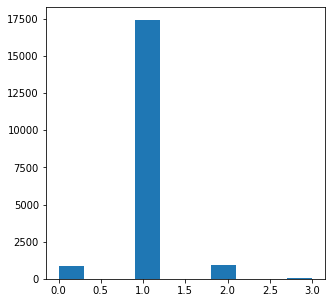

In [74]:
# How many cell types were annotated to each cell
rcParams['figure.figsize'] = (5, 5)
a = plt.hist(assignment_df.sum(axis=1))

In [75]:
# For each cell make a (standard) string of annotated cell types: 
# e.g. each annotated cell type in the same order, separated by '_' when multiple cell types were annotated
type_unions = []
for idx, row in assignment_df.iterrows():
    type_union = ''
    for col in sorted(row.index):
        if row[col]:
            type_union = type_union + col + '_'
    if type_union == '':
        type_union = 'NA'
    type_unions.append(type_union.rstrip('_'))

In [76]:
# Add cell types strings of cells to scores/assignment DF
assignment_df['type_union'] = type_unions
assignment_df[clusters_col] = adata_rawnormalised.obs[clusters_col].values

### Annotate clusters

In [77]:
# Make DF of marker gene expressions (normalised, log transformed), scaled for each gene to [0,1]
used_markers = list(dict.fromkeys([marker for marker_list in markers_selection.values() for marker in marker_list]))
gene_idx = adata_rawnormalised.raw.var_names.isin(used_markers)
genes = adata_rawnormalised.raw.var_names[gene_idx]
scaled_expression = pd.DataFrame(pp.minmax_scale(adata_rawnormalised.raw.X.toarray()[:, gene_idx]), columns=genes,index=adata_rawnormalised.obs.index)[[marker for marker in used_markers if marker in genes]]

In [78]:
def add_category(df, idxs, col, category):
    """
    Add single value to multiple rows of DF column (useful when column might be categorical). 
    If column is categorical the value is beforehand added in the list of present categories 
    (required for categorical columns). 
    :param df: DF to which to add values
    :param idxs: Index names of rows where the value should be assigned to the column.
    :param col: Column to which to add the value.
    :param category: The value to add to rows,column.
    """
    # If column is already present, is categorical and value is not in categories add the value to categories first.
    if col in df.columns and df[col].dtype.name == 'category' and category not in df[col].cat.categories:
        df[col] = df[col].cat.add_categories([category])
    df.loc[idxs, col] = category

In [79]:
def subcluster(adata_cluster, res, original_cluster, assignment_df_temp, clusters_name_prefix='leiden_scaled_r'):
    """
    Cluster adata and add reult into cell type assignment DF. Plot the clustering on UMAP.
    Add name of the original cluster to which the adata belongs to new cluster names.
    Cluster column name: clusters_name_prefix+str(res) 
    :param adata_cluster: Adata (with already computed neighbours and UMAP) to cluster with leiden clustering. 
    :param res: Leiden resolution
    :param original_cluster: Original cluster name, new clusters are named 'original cluster'+'_'+'new cluster'
    :param assignment_df_temp: assignment_df to which to add clusters - should have same row order as adata
    :param clusters_name_prefix: Prefix for cluster column name.
    """
    clusters_col_name = clusters_name_prefix + str(res)
    sc.tl.leiden(adata_cluster, resolution=res, key_added=clusters_col_name, directed=True, use_weights=True)
    adata_cluster.obs[clusters_col_name] = [original_cluster + '_' + subcluster for subcluster in adata_cluster.obs[clusters_col_name]]
    sc.pl.umap(adata_cluster, color=clusters_col_name)
    time.sleep(1.0)
    
    assignment_df_temp['leiden_scaled_r' + str(res)] = adata_cluster.obs['leiden_scaled_r' + str(res)].values
    
def get_cluster_data(adata_original, cluster, cluster_col, assignment_df):
    """
    Subset adata and assignment_df to cluster.
    :param adata_original: Adata to subset.
    :param  cluster: Cluster for which to extract the data.
    :param cluster_col: Column where clusters are listed. Should be present in adata and assignment_df.
    :param assignment_df: DF with cell type assignmnets in column 'type_union' and cluster info. Should have index names
    that are present in adata.obs.index.
    :return: Subset of adata, assignment_df
    """
    adata_temp = adata_original[adata_original.obs[cluster_col] == cluster].copy()
    assignment_df_temp = pd.DataFrame(assignment_df.loc[adata_temp.obs.index, 'type_union'])
    return adata_temp, assignment_df_temp

def cluster_annotate(assignment_df, cluster_col, present_threshold, nomain_threshold, save, cluster_annotation, adata_main):
    """
    Loop through clusters, check present cell types and if there is no main cell type plot expression and QC metrics.
    For each cluster list proportion of present cell types.
    Expression (normalised, log transformed, [0,1] per gene scaled) is plotted for marker genes across cells (heatmap).
    QC metrics are plotted as scatterplot of N genes and N counts with cluster cells overlayed over all cels.
    :param assignment_df: DF with cell type assignment in column 'type_union' and cluster assignment.
    :param cluster_col: Cluster column name in assignment_df.
    :param present_threshold: Count among present cell types each cell type present if it represents 
    at least present_threshold proportion of cells in cluster. 
    :param nomain_threshold: If only 1 cell type was selected with present_threshold and 
    no cell type is present at proportion at least nomain_threshold add 'other' to annotated cell types list.
    :param save: Save cluster information to adata_main (column 'cluster') and cell types list to cluster_annotation.
    :param cluster_annotation: Dict where each cluster (key) has list of annotated cell types (value).
    :param adata_main: Add cluster to adata_main.obs.cluster. Use this adata for plotting of QC mettrics (for this a
    column 'temp_selected' is added.)
    """
    for group in assignment_df[['type_union', cluster_col]].groupby(cluster_col):
        types_summary = group[1].type_union.value_counts(normalize=True)
        present = list(types_summary[types_summary >= present_threshold].index)
        if len(present) == 1 and types_summary.max() < nomain_threshold:
            present.append('other')
            
        if save:
            cluster_annotation[group[0]] = present
            add_category(df=adata_main.obs, idxs=group[1].index, col='cluster', category=group[0])
        
        print('\nCluster:', group[0], '\tsize:', group[1].shape[0])    
        print('Present:', present)
        print(types_summary)
        
        #present_nonna=[cell_type for cell_type in present if cell_type !='NA']
        #if len(present_nonna)!=1:
        if len(present) != 1 or present == ['NA']:
            sb.clustermap(pd.DataFrame(scaled_expression.loc[group[1].index, :]), col_cluster=False, xticklabels=1, yticklabels=False, figsize=(7, 5), vmin=0, vmax=1)
            plt.title('Cluster: ' + group[0] + ' assigned:' + str(present))
            adata_main.obs['temp_selected'] = adata_main.obs.index.isin(group[1].index)
            rcParams['figure.figsize'] = (5, 5)
            p1 = sc.pl.scatter(adata_main, 'n_counts', 'n_genes', color='temp_selected', size=40, color_map='viridis')
            time.sleep(1.0)

def save_cluster_annotation(adata, cluster_name, cell_types: list, cell_names):
    """
    Save cluster information for a set of cells to cluster_annotation (from outer scope) dictionary and specified adata.
    :param adata: Adata to which to save cluster name for cells. 
    Cluster information is saved to adata.obs in 'cluster' column.
    :param cluster_name: Name of the cluster.
    :param cell_types: List of cell types annotated to the cluster.
    :param cell_names: Cell names (matching adata.obs.index) to which the new cluster is asigned.
    """
    cluster_annotation[cluster_name] = cell_types
    add_category(df=adata.obs, idxs=cell_names, col='cluster', category=cluster_name)

In [80]:
#Save cell types annotated to each cluster
cluster_annotation = dict()


Cluster: 0 	size: 7706
Present: ['beta']
beta                                          0.941604
NA                                            0.015443
beta_stellate_activated                       0.011939
beta_delta                                    0.007916
beta_ductal                                   0.007397
beta_stellate_quiescent                       0.004282
alpha_beta                                    0.003763
delta                                         0.003244
beta_gamma                                    0.001557
acinar_beta                                   0.000649
beta_schwann                                  0.000519
alpha_beta_delta                              0.000260
beta_immune                                   0.000260
beta_stellate_activated_stellate_quiescent    0.000130
acinar                                        0.000130
beta_immune_stellate_activated                0.000130
delta_gamma                                   0.000130
beta_epsilon           

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'cluster' as categorical


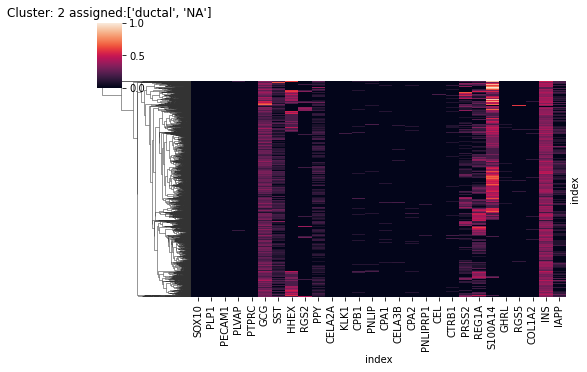

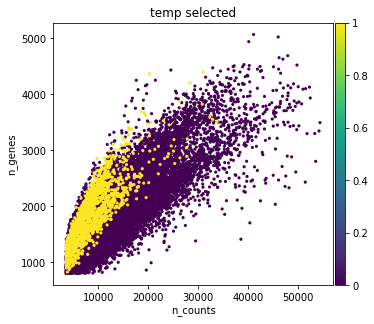


Cluster: 3 	size: 1316
Present: ['delta', 'gamma']
delta                               0.568389
gamma                               0.219605
alpha_beta                          0.069149
NA                                  0.041033
alpha                               0.029635
beta                                0.023556
beta_delta                          0.018237
beta_gamma                          0.005319
alpha_delta                         0.004559
delta_stellate_activated            0.003799
delta_stellate_quiescent            0.003040
delta_ductal                        0.002280
epsilon                             0.002280
delta_gamma                         0.001520
ductal_gamma                        0.001520
beta_schwann                        0.000760
alpha_beta_epsilon                  0.000760
beta_delta_stellate_activated       0.000760
stellate_activated                  0.000760
delta_schwann                       0.000760
alpha_beta_delta                    0.000760
del

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


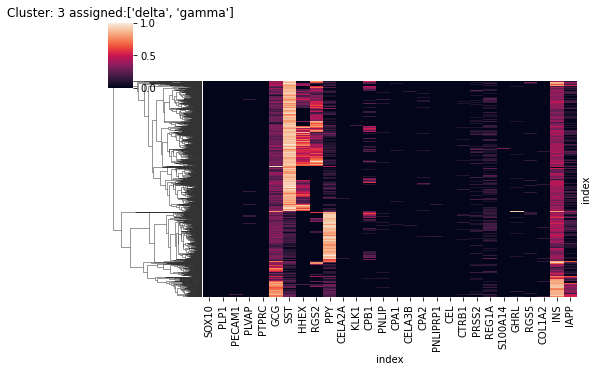

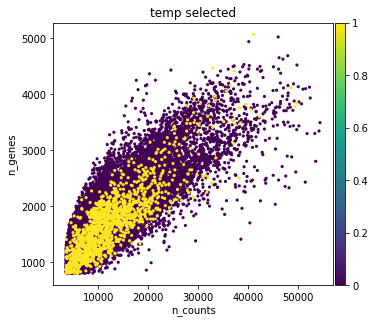


Cluster: 4 	size: 893
Present: ['stellate_quiescent']
stellate_quiescent                       0.919373
stellate_activated_stellate_quiescent    0.064950
alpha_stellate_quiescent                 0.006719
NA                                       0.005599
ductal_stellate_quiescent                0.003359
Name: type_union, dtype: float64

Cluster: 5 	size: 820
Present: ['acinar']
acinar                                          0.870732
acinar_ductal                                   0.054878
NA                                              0.037805
acinar_stellate_quiescent                       0.007317
acinar_beta                                     0.007317
ductal                                          0.006098
acinar_alpha                                    0.006098
acinar_stellate_activated                       0.001220
acinar_stellate_activated_stellate_quiescent    0.001220
gamma                                           0.001220
alpha                                           0

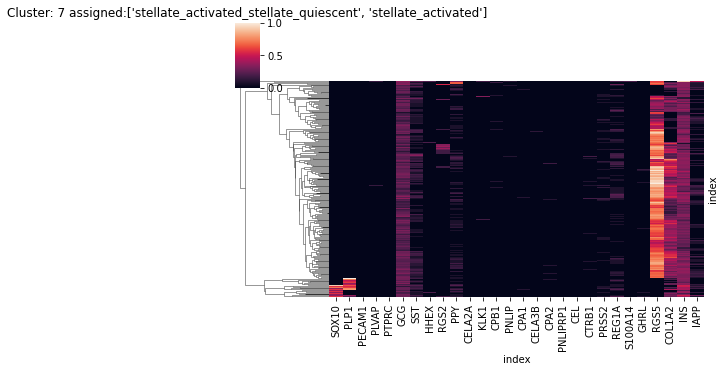

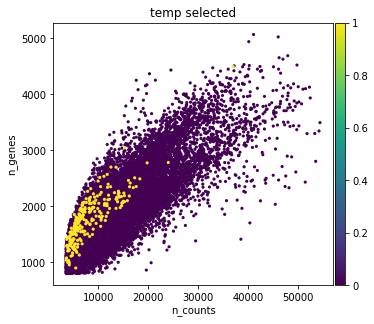


Cluster: 8 	size: 83
Present: ['NA', 'immune']
NA              0.650602
immune          0.216867
beta            0.036145
alpha           0.036145
beta_delta      0.012048
ductal          0.012048
beta_immune     0.012048
alpha_immune    0.012048
delta           0.012048
Name: type_union, dtype: float64


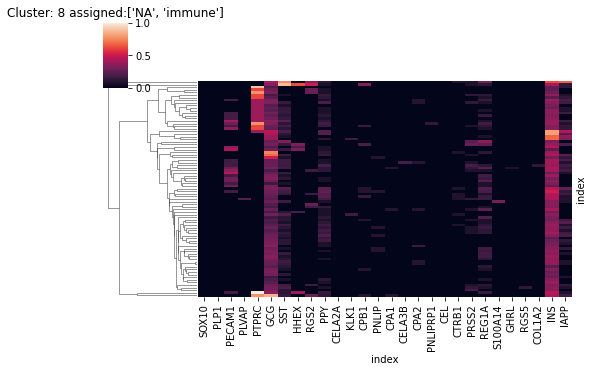

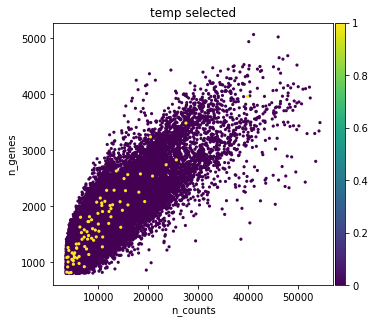

In [81]:
# Display cell type annotation distribution of each cluster.
cluster_annotate(assignment_df=assignment_df, cluster_col=clusters_col, present_threshold=0.1, nomain_threshold=0.7, save=True, cluster_annotation=cluster_annotation, adata_main=adata_rawnormalised)

In [82]:
# Correct annotation
cluster_annotation['8'] = ['immune']
cluster_annotation['2'] = ['ductal']
cluster_annotation['6'] = ['endothelial', 'NA']

**** Original cluster 3


/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'leiden_scaled_r0.7' as categorical


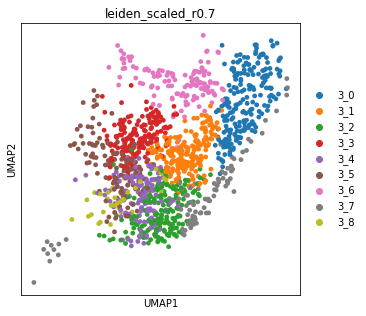


Cluster: 3_0 	size: 210
Present: ['gamma', 'other']
gamma                       0.728571
alpha                       0.128571
NA                          0.042857
delta                       0.023810
alpha_delta                 0.019048
epsilon                     0.014286
alpha_beta                  0.014286
beta_gamma                  0.009524
alpha_beta_epsilon          0.004762
delta_gamma                 0.004762
ductal_gamma                0.004762
alpha_stellate_activated    0.004762
Name: type_union, dtype: float64


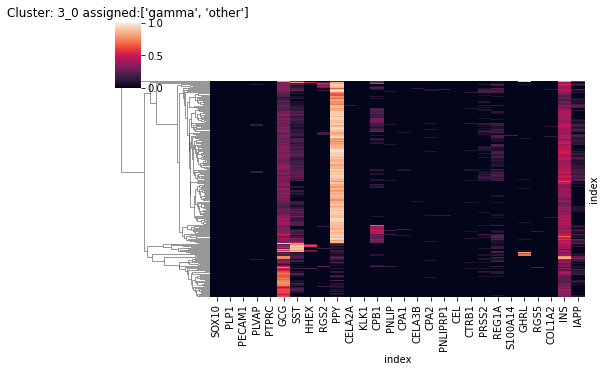

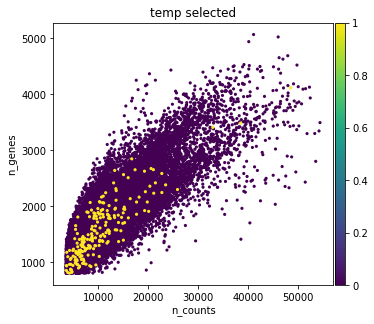


Cluster: 3_1 	size: 206
Present: ['delta', 'gamma']
delta          0.616505
gamma          0.305825
NA             0.033981
beta_gamma     0.009709
alpha_beta     0.009709
beta_delta     0.009709
alpha          0.004854
delta_gamma    0.004854
beta           0.004854
Name: type_union, dtype: float64


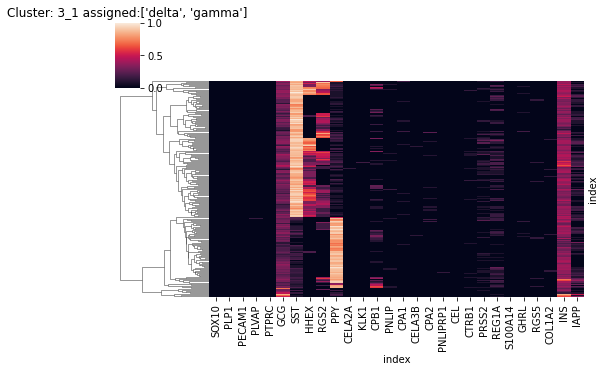

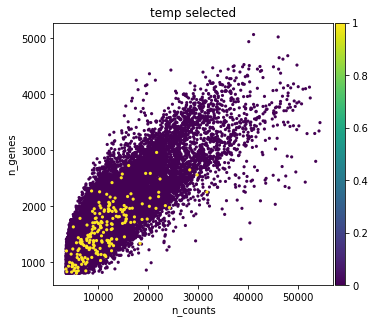


Cluster: 3_2 	size: 190
Present: ['delta']
delta                       0.831579
gamma                       0.057895
NA                          0.031579
beta                        0.026316
beta_delta                  0.021053
beta_gamma                  0.010526
alpha                       0.010526
delta_stellate_activated    0.005263
alpha_beta                  0.005263
Name: type_union, dtype: float64

Cluster: 3_3 	size: 168
Present: ['delta']
delta                       0.869048
NA                          0.035714
beta                        0.035714
gamma                       0.035714
beta_delta                  0.011905
delta_stellate_quiescent    0.005952
alpha_beta                  0.005952
Name: type_union, dtype: float64

Cluster: 3_4 	size: 141
Present: ['delta']
delta                       0.893617
delta_stellate_activated    0.021277
beta_delta                  0.014184
NA                          0.014184
gamma                       0.014184
beta                     

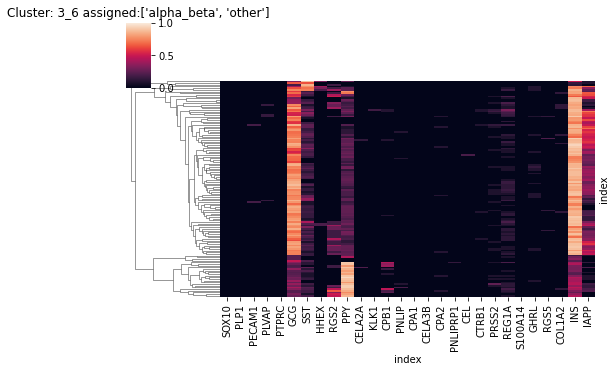

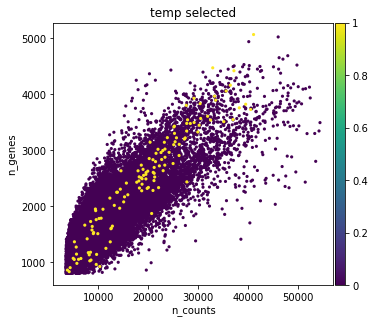


Cluster: 3_7 	size: 94
Present: ['delta', 'gamma']
delta                               0.382979
gamma                               0.340426
NA                                  0.127660
alpha                               0.042553
delta_stellate_quiescent            0.021277
beta_schwann                        0.010638
beta                                0.010638
stellate_activated                  0.010638
alpha_beta                          0.010638
beta_delta                          0.010638
ductal_gamma                        0.010638
delta_schwann_stellate_quiescent    0.010638
alpha_delta                         0.010638
Name: type_union, dtype: float64


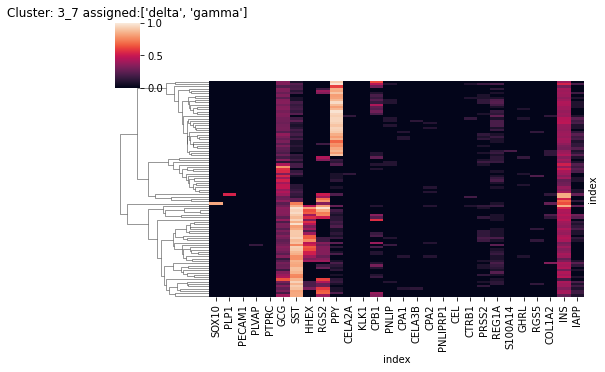

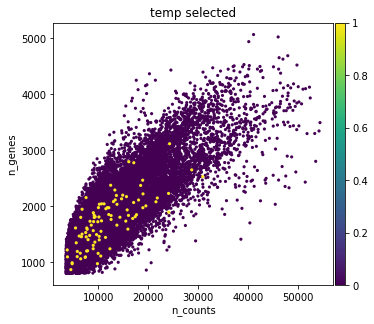

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'leiden_scaled_r0.7' as categorical



Cluster: 3_8 	size: 40
Present: ['delta']
delta    0.925
NA       0.050
beta     0.025
Name: type_union, dtype: float64
**** Original cluster 6


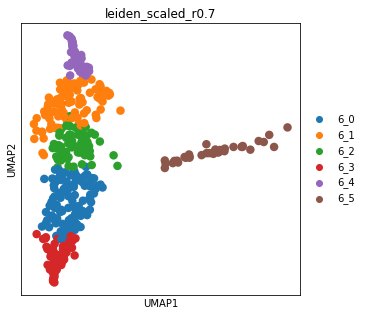

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'leiden_scaled_r0.7' as categorical



Cluster: 6_0 	size: 121
Present: ['endothelial']
endothelial                       0.942149
endothelial_stellate_activated    0.024793
endothelial_stellate_quiescent    0.024793
beta_endothelial                  0.008264
Name: type_union, dtype: float64

Cluster: 6_1 	size: 90
Present: ['endothelial']
endothelial                       0.944444
NA                                0.033333
endothelial_stellate_quiescent    0.022222
Name: type_union, dtype: float64

Cluster: 6_2 	size: 68
Present: ['endothelial']
endothelial                       0.897059
endothelial_stellate_activated    0.058824
NA                                0.014706
delta_endothelial                 0.014706
acinar_endothelial                0.014706
Name: type_union, dtype: float64

Cluster: 6_3 	size: 62
Present: ['endothelial']
endothelial                       0.983871
endothelial_stellate_activated    0.016129
Name: type_union, dtype: float64

Cluster: 6_4 	size: 38
Present: ['endothelial']
endothelial         

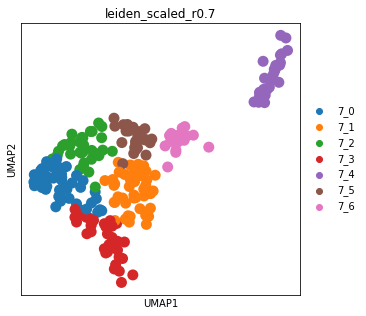


Cluster: 7_0 	size: 55
Present: ['stellate_activated_stellate_quiescent']
stellate_activated_stellate_quiescent    1.0
Name: type_union, dtype: float64

Cluster: 7_1 	size: 46
Present: ['stellate_activated_stellate_quiescent']
stellate_activated_stellate_quiescent          0.804348
stellate_activated                             0.152174
stellate_quiescent                             0.021739
gamma_stellate_activated_stellate_quiescent    0.021739
Name: type_union, dtype: float64

Cluster: 7_2 	size: 36
Present: ['stellate_activated_stellate_quiescent', 'stellate_activated']
stellate_activated_stellate_quiescent    0.611111
stellate_activated                       0.388889
Name: type_union, dtype: float64


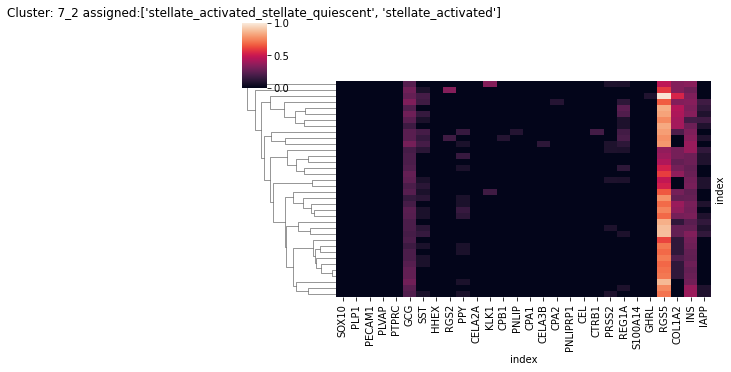

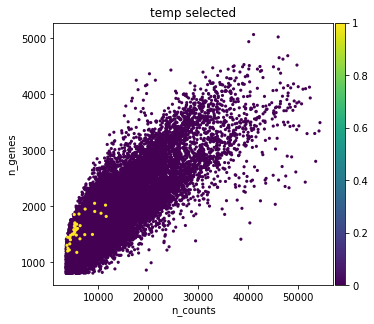


Cluster: 7_3 	size: 34
Present: ['stellate_activated_stellate_quiescent']
stellate_activated_stellate_quiescent    1.0
Name: type_union, dtype: float64

Cluster: 7_4 	size: 30
Present: ['schwann', 'schwann_stellate_quiescent', 'NA']
schwann                                       0.366667
schwann_stellate_quiescent                    0.333333
NA                                            0.200000
stellate_quiescent                            0.033333
beta_stellate_activated_stellate_quiescent    0.033333
beta_ductal_stellate_activated                0.033333
Name: type_union, dtype: float64


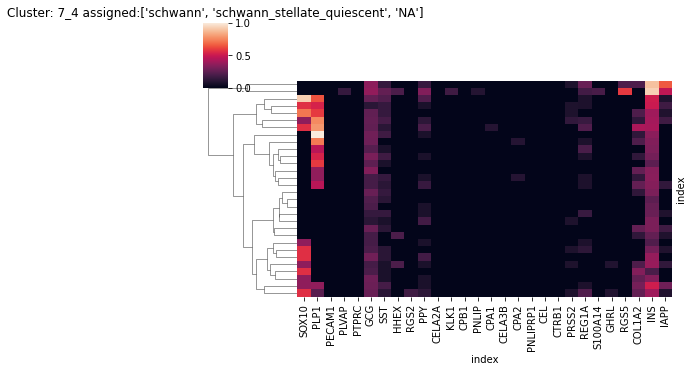

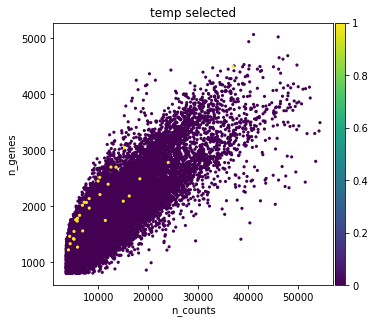


Cluster: 7_5 	size: 26
Present: ['stellate_activated_stellate_quiescent', 'stellate_activated']
stellate_activated_stellate_quiescent         0.500000
stellate_activated                            0.384615
NA                                            0.076923
beta_stellate_activated_stellate_quiescent    0.038462
Name: type_union, dtype: float64


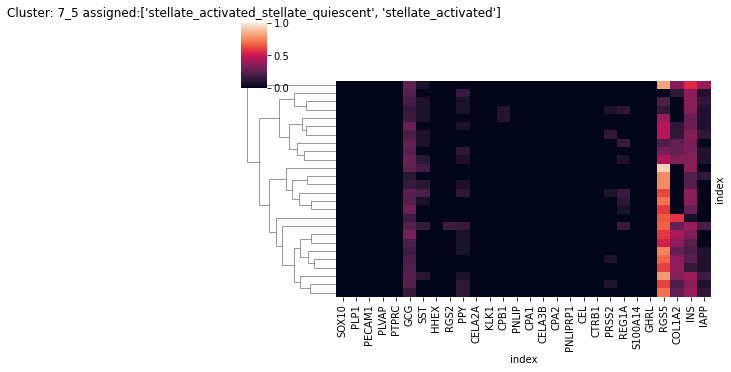

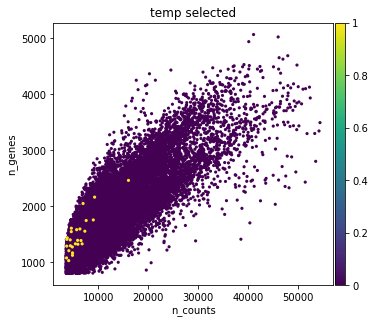


Cluster: 7_6 	size: 21
Present: ['stellate_activated', 'stellate_activated_stellate_quiescent']
stellate_activated                             0.428571
stellate_activated_stellate_quiescent          0.380952
NA                                             0.095238
gamma_stellate_activated_stellate_quiescent    0.047619
stellate_quiescent                             0.047619
Name: type_union, dtype: float64


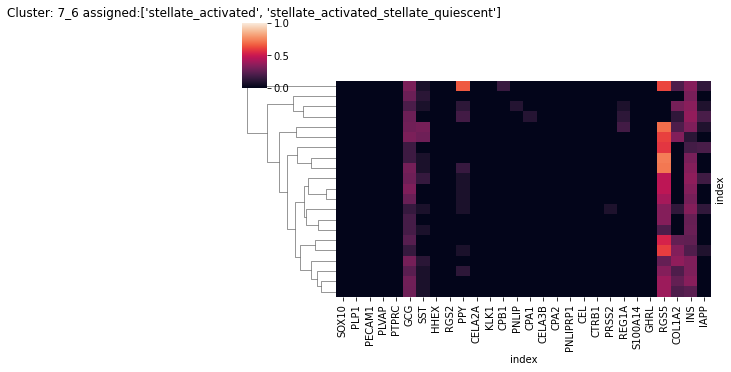

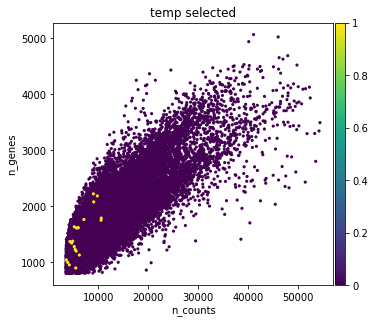

In [83]:
#TODO change or disable
# currently, this just spins in circles. Accept 2-clusters?

# recluster clusters that previously had less or more than 1 annotted cell type (exclusing  other).
for cluster in sorted(list(adata_rawnormalised.obs['cluster'].unique()), key=int):
    if len(cluster_annotation[cluster]) != 1 or len([cell_type for cell_type in cluster_annotation[cluster]]) == 0:
        print('**** Original cluster', cluster)
        res = 0.7
        adata_temp, assignment_df_temp = get_cluster_data(adata_original=adata_rawnormalised, cluster=cluster, cluster_col='cluster', assignment_df=assignment_df)
        subcluster(adata_cluster=adata_temp, res=res, original_cluster=cluster, assignment_df_temp=assignment_df_temp)
        cluster_annotate(assignment_df=assignment_df_temp, cluster_col='leiden_scaled_r' + str(res), present_threshold=0.2, nomain_threshold=0.8, save=True, cluster_annotation=cluster_annotation, adata_main=adata_rawnormalised)

In [84]:
# Correct entries in cluster_annotation dict - all clusters that do not have exactly one entry will be assigned 'NA'
# If cluster is to be removed add 'remove'

#cluster_annotation['13_3'] = ['delta'] # Could not be resolved even with subclustering
cluster_annotation['3_0'] = ['gamma']
cluster_annotation['3_6'] = ['alpha_beta']
#cluster_annotation['3_7'] = ?
# using only S100 its hard to tell stellate_activated and stellate_quiescent apart.
cluster_annotation['7_0'] = ['stellate_activated']
cluster_annotation['7_1'] = ['stellate_activated']
cluster_annotation['7_2'] = ['stellate_activated']
cluster_annotation['7_3'] = ['stellate_activated']
cluster_annotation['7_4'] = ['schwann'] # there be doublets here
cluster_annotation['7_5'] = ['stellate_activated']
cluster_annotation['7_6'] = ['stellate_activated']

The below would assign cells to cts based on marker scores. This will not be used. Instead cells will be given annotation NA.

#### Add cluster based annotation to adata

In [85]:
# Display cluster annotation of clusters that will be used
clusters = list(adata_rawnormalised.obs['cluster'].unique())
clusters.sort()
for cluster in clusters:
    print(cluster, cluster_annotation[cluster])

0 ['beta']
1 ['alpha']
2 ['ductal']
3_0 ['gamma']
3_1 ['delta', 'gamma']
3_2 ['delta']
3_3 ['delta']
3_4 ['delta']
3_5 ['delta']
3_6 ['alpha_beta']
3_7 ['delta', 'gamma']
3_8 ['delta']
4 ['stellate_quiescent']
5 ['acinar']
6_0 ['endothelial']
6_1 ['endothelial']
6_2 ['endothelial']
6_3 ['endothelial']
6_4 ['endothelial']
6_5 ['endothelial_stellate_activated_stellate_quiescent']
7_0 ['stellate_activated']
7_1 ['stellate_activated']
7_2 ['stellate_activated']
7_3 ['stellate_activated']
7_4 ['schwann']
7_5 ['stellate_activated']
7_6 ['stellate_activated']
8 ['immune']


In [86]:
# Add cell type annotation to clusters. 
# If clusters was annotated with more than one cell type (inbcluding NA or other) set it to 'NA'.
if 'cell_type' in adata_rawnormalised.obs.columns:
    adata_rawnormalised.obs.drop('cell_type', axis=1, inplace=True)
for row_idx in adata_rawnormalised.obs.index:
    cluster = adata_rawnormalised.obs.at[row_idx, 'cluster']
    cell_type = cluster_annotation[cluster]
    if len(cell_type) != 1:
        cell_type = 'NA'
    else:
        cell_type = cell_type[0]
        
    add_category(df=adata_rawnormalised.obs, idxs=row_idx, col='cell_type', category=cell_type)

### Cell type annotation evaluation

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'cell_type' as categorical


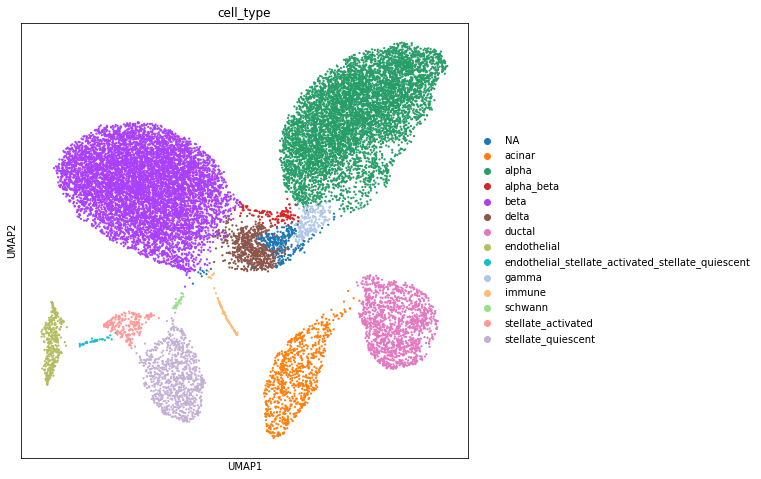

In [87]:
# Plot cell types on UMPA (pre-annotated and new ones)
rcParams['figure.figsize'] = (8, 8)
sc.pl.umap(adata_rawnormalised, color=['cell_type'], size=20, use_raw=False, wspace=0.3)

In [88]:
# Count of new cell types
adata_rawnormalised.obs.cell_type.value_counts()

beta                                                 7706
alpha                                                6466
ductal                                               1334
stellate_quiescent                                    893
acinar                                                820
delta                                                 677
endothelial                                           379
NA                                                    300
stellate_activated                                    218
gamma                                                 210
alpha_beta                                            129
immune                                                 83
endothelial_stellate_activated_stellate_quiescent      35
schwann                                                30
Name: cell_type, dtype: int64

Text(0.5, 1.0, 'cell_type')

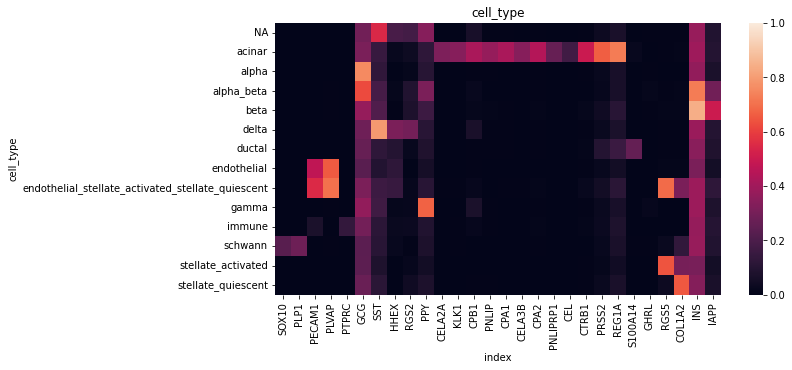

In [89]:
# Plot mean marker expression in each cluster
rcParams['figure.figsize'] = (10,5)
#fig,ax=plt.subplots()
#sb.heatmap(scaled_expression.groupby(adata_rawnormalised.obs['pre_cell_type']).mean(),yticklabels=1,xticklabels=1,
#          vmin=0,vmax=1)
#ax.set_title('pre_cell_type')
fig, ax = plt.subplots()
sb.heatmap(scaled_expression.groupby(adata_rawnormalised.obs['cell_type']).mean(), yticklabels=1, xticklabels=1, vmin=0, vmax=1)
ax.set_title('cell_type')

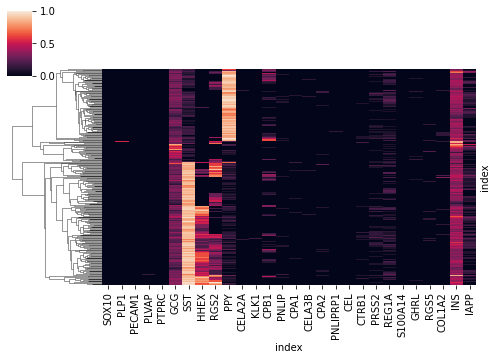

In [90]:
# Subset marker expression to NA cell type cells and plot heatmap
sb.clustermap(pd.DataFrame(scaled_expression[adata_rawnormalised.obs.cell_type == 'NA']), row_cluster=True, col_cluster=False, xticklabels=1, yticklabels=False, figsize=(7,5), vmin=0, vmax=1)

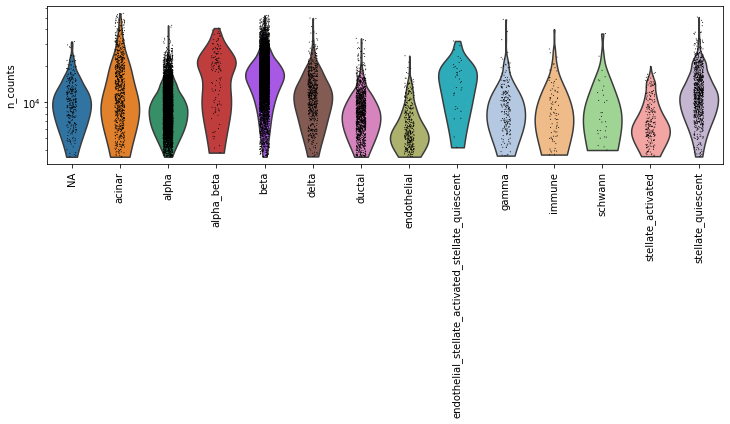

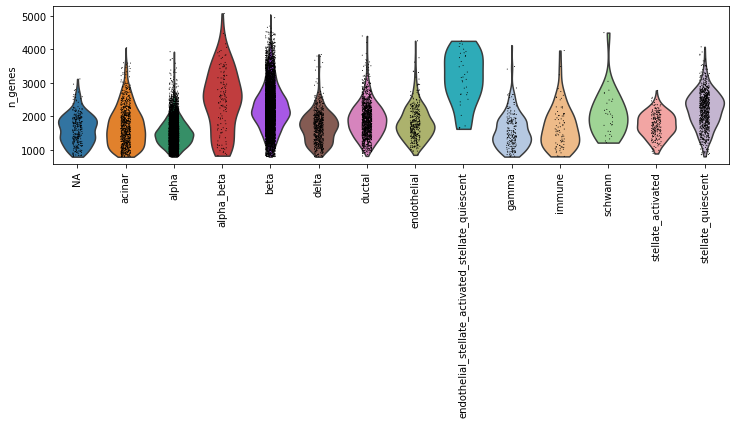

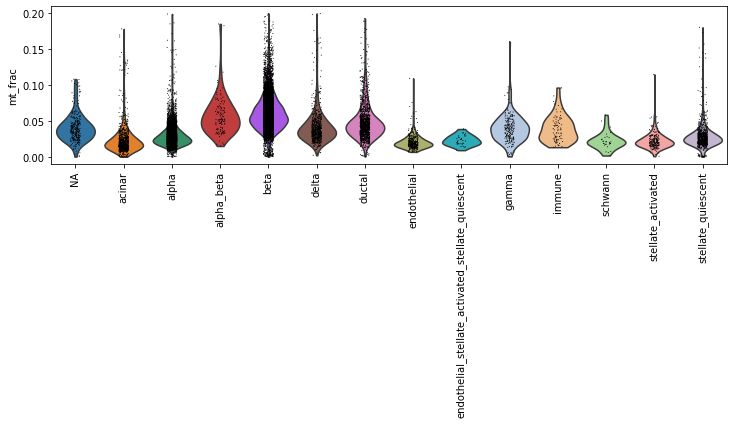

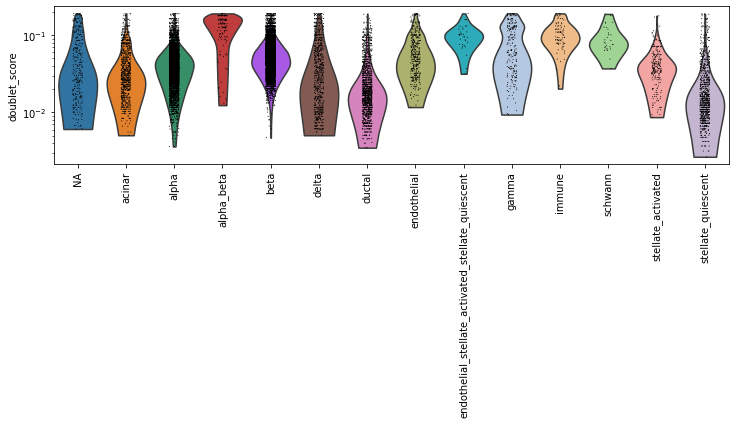

In [91]:
# QC metrics per cell type
rcParams['figure.figsize'] = (10, 3)
sc.pl.violin(adata_rawnormalised, ['n_counts'], groupby='cell_type', size=1, log=True, rotation=90)
sc.pl.violin(adata_rawnormalised, ['n_genes'], groupby='cell_type', size=1, log=False, rotation=90)
sc.pl.violin(adata_rawnormalised, ['mt_frac'], groupby='cell_type', size=1, log=False, rotation=90)
sc.pl.violin(adata_rawnormalised, 'doublet_score', groupby='cell_type', size=1, log=True, rotation=90)

In [92]:
# Add cell type to adata
adata.obs['cell_type'] = adata_rawnormalised.obs.cell_type
# Add final clusters and starting clusters to adata
adata.obs[['cluster', clusters_col]] = adata_rawnormalised.obs[['cluster', clusters_col]]
# Add cell type scores
# score_cols = [col for col in scores_df_norm.columns if '_score' in col]
# adata.obs[score_cols] = scores_df_norm[score_cols].reindex(adata.obs.index)

#### Cell type markers

Upregulated genes in each cell type compared to other cells on normalised log scaled data.

In [93]:
# Compute overexpressed genes in each cell type on normalised log scaled data
#Retain only cell types with >=10 cells and non-NA annotation
groups_counts = adata.obs.cell_type.value_counts()
groups = [cell_type for cell_type in groups_counts[groups_counts >= 10].index if cell_type != 'NA']
# Compute markers
sc.tl.rank_genes_groups(adata, groupby='cell_type', groups=groups, use_raw=False)
sc.tl.filter_rank_genes_groups(adata, groupby='cell_type', use_raw=False)

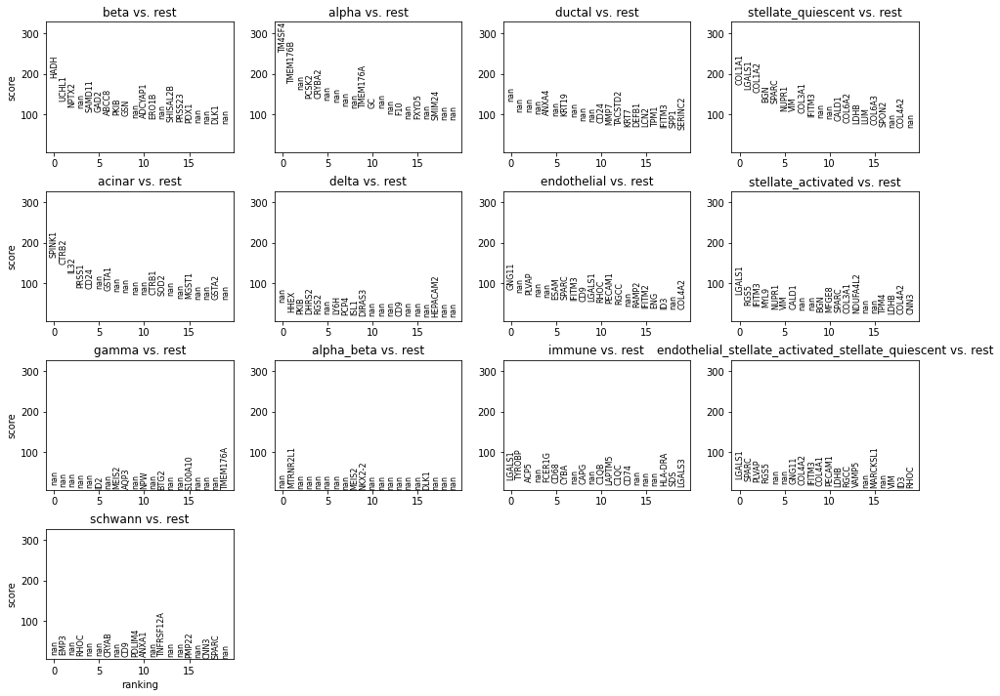

In [94]:
# Plot cell_type vs rest upregulated genes
rcParams['figure.figsize'] = (4, 3)
sc.pl.rank_genes_groups(adata,key='rank_genes_groups_filtered')

categories: NA, acinar, alpha, etc.
var_group_labels: beta, alpha, ductal, etc.


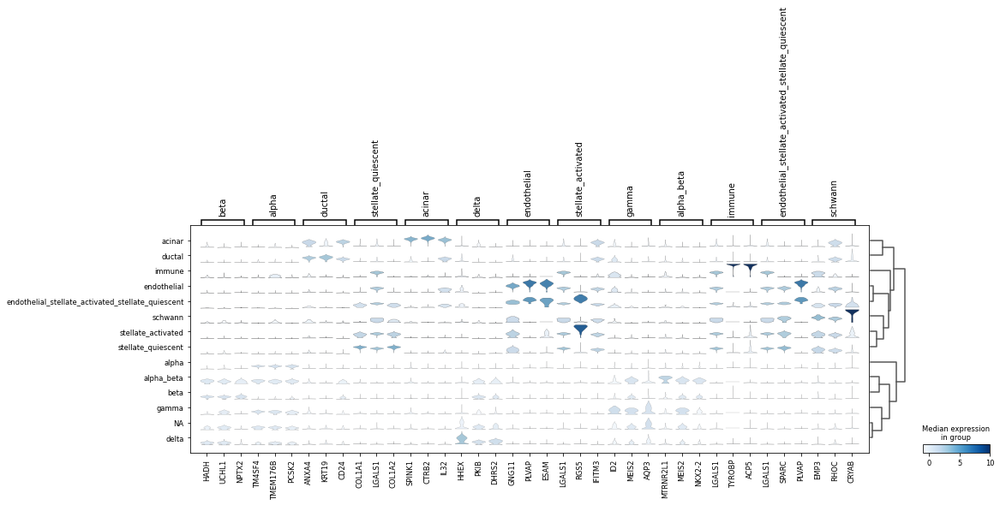

In [95]:
# Plot expression of cell type upregulated genes on normalised log transformed z-scaled data
adata_scl.uns['rank_genes_groups_filtered'] = adata.uns['rank_genes_groups_filtered']
adata_scl.obs['cell_type'] = adata.obs['cell_type']
sc.pl.rank_genes_groups_stacked_violin(adata_scl, key='rank_genes_groups_filtered', n_genes=3, use_raw=False)

### Expected doublet rates

Adapted from https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6126471/#ref-7, but using 0.1 as doublet rate (described in my notes).

Expected multiplet number is calculated for each file separately.

Most above observed multiple cell type cells are likely dublets. The only ones where this is not clear are beta_delta and acinar_ductal.

In [96]:
# Singlet cell types whose multiplet rates are predicted
cell_types = ['ductal','acinar']
# DFs with expected multiplet rates
expected_dfs = []
# Calculate expected rate for each file separately
for file in adata.obs.file.unique():
    print('\nFile:', file)
    # Exclude some endocrine cells as they form completely separate populations 
    # with no multiplets in neighbourhood)
    exclude_types = []
    cell_type_temp = adata.obs.query('file == "' + file + '" & cell_type not in @exclude_types').cell_type.copy()
    
    # N of droplets containing at least one cell of the relevant cell type
    Ns = dict()
    for cell_type in cell_types:
        n_celltype = cell_type_temp.str.contains(cell_type).sum()
        Ns[cell_type] = n_celltype
    print('N droplets that contain at least one:', Ns)
    
    # Calculate N (see formula in notes)
    N = emr.get_N(Ns=Ns.values())
    regex_any = '|'.join(['.*' + cell_type + '.*' for cell_type in cell_types])
    print('N:', round(N, 1), '(observed cell-containing N with relevant cell types:', cell_type_temp.str.contains(fr'{regex_any}').sum(), ')')
    
    # Calculate mu for each cell type
    mus = dict()
    for cell_type in cell_types:
        mus[cell_type] = emr.mu_cell_type(N_cell_type=Ns[cell_type], N=N)
    print('mu:', {k:round(v, 4) for k, v in mus.items()})
    
    # Extract multiplet types and their components
    multiplet_types = dict()
    for cell_type in cell_type_temp.unique():
        # Get components of multiplets by retaining name parts contained in original cell type dict
        components_all = cell_type.split('_')
        components_relevant = [type_singlet for type_singlet in components_all if type_singlet in cell_types]
        # retain only cts containing only relevant components
        all_relevant = all([component in cell_types for component in components_all])
        if len(components_relevant) > 1 and all_relevant:
            multiplet_types[cell_type] = components_relevant
            # This does not assure that initially the cell types are not counted wrongly 
            # (e.g. including proliferative, ...)
            #if len(components_relevant) < len(components_all):
            #    warnings.warn('Multiplet type has additional unrecognised component: '+cell_type)
    #print('Relevant multiplet cell types:',multiplet_types.keys())
    
    # This also analyses O and E of singlet types, but this is not so relevant as changes in multiplets also 
    # affect it?
    #types_OE= dict(zip(cell_types,[[i] for i in cell_types]))
    #types_OE.update(multiplet_types)
    
    # Calculate O (observed) and E (expected) numbers
    expected_df = pd.DataFrame(index=multiplet_types.keys(), columns=['O_' + file, 'E_' + file])
    #for multiplet, components in types_OE.items():
    for multiplet, components in multiplet_types.items():
        absent = np.setdiff1d(cell_types, components)
        expected_df.at[multiplet, 'O_' + file] = (cell_type_temp == multiplet).sum()
        expected_df.at[multiplet, 'E_' + file] = emr.expected_multiplet(mu_present=[mus[cell_type] for cell_type in components], mu_absent=[mus[cell_type] for cell_type in absent], N=N)
    expected_dfs.append(expected_df)
    
# Merge O/E rates for all files into single DF
display(pd.concat(expected_dfs, axis=1))
del cell_type_temp


File: Donor_2
N droplets that contain at least one: {'ductal': 13, 'acinar': 14}
N: 10000.0 (observed cell-containing N with relevant cell types: 27 )
mu: {'ductal': 0.0013, 'acinar': 0.0014}

File: Donor_7
N droplets that contain at least one: {'ductal': 234, 'acinar': 123}
N: 775.6 (observed cell-containing N with relevant cell types: 357 )
mu: {'ductal': 0.3591, 'acinar': 0.1727}

File: Donor_3
N droplets that contain at least one: {'ductal': 138, 'acinar': 52}
N: 419.1 (observed cell-containing N with relevant cell types: 190 )
mu: {'ductal': 0.3994, 'acinar': 0.1325}

File: Donor_4
N droplets that contain at least one: {'ductal': 128, 'acinar': 22}
N: 343.8 (observed cell-containing N with relevant cell types: 150 )
mu: {'ductal': 0.4657, 'acinar': 0.0661}

File: Donor_10
N droplets that contain at least one: {'ductal': 184, 'acinar': 219}
N: 864.0 (observed cell-containing N with relevant cell types: 403 )
mu: {'ductal': 0.2395, 'acinar': 0.2923}

File: Donor_1
N droplets that c

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
/dss/dsshome1/lxc07/gobi009/rauschning/expected_multiplet_rate.py:25: RuntimeWarning: invalid value encountered in log
  return -np.log((N-N_cell_type)/N)
/dss/dsshome1/lxc07/gobi00

,O_Donor_2,E_Donor_2,O_Donor_7,E_Donor_7,O_Donor_3,E_Donor_3,O_Donor_4,E_Donor_4,O_Donor_10,E_Donor_10,...,O_Donor_9,E_Donor_9,O_Donor_5,E_Donor_5,O_Donor_12,E_Donor_12,O_Donor_6,E_Donor_6,O_Donor_11,E_Donor_11


In [97]:
# Singlet cell types whose multiplet rates are predicted
cell_types = ['beta', 'delta']
# DFs with expected multiplet rates
expected_dfs = []
# Calculate expected rate for each file separately
for file in adata.obs.file.unique():
    print('\nFile:', file)
    # Exclude some endocrine cells as they form completely separate populations 
    # with no multiplets in neighbourhood)
    exclude_types = []
    cell_type_temp = adata.obs.query('file == "' + file + '" & cell_type not in @exclude_types').cell_type.copy()
    
    # N of droplets containing at least one cell of the relevant cell type
    Ns = dict()
    for cell_type in cell_types:
        n_celltype = cell_type_temp.str.contains(cell_type).sum()
        Ns[cell_type] = n_celltype
    print('N droplets that contain at least one:', Ns)
    
    # Calculate N (see formula in notes)
    N = emr.get_N(Ns=Ns.values())
    regex_any = '|'.join(['.*' + cell_type + '.*' for cell_type in cell_types])
    print('N:', round(N, 1), '(observed cell-containing N with relevant cell types:', cell_type_temp.str.contains(fr'{regex_any}').sum(), ')')
    
    # Calculate mu for each cell type
    mus = dict()
    for cell_type in cell_types:
        mus[cell_type] = emr.mu_cell_type(N_cell_type=Ns[cell_type], N=N)
    print('mu:', {k: round(v, 4) for k, v in mus.items()})
    
    # Extract multiplet types and their components
    multiplet_types = dict()
    for cell_type in cell_type_temp.unique():
        # Get components of multiplets by retaining name parts contained in original cell type dict
        components_all = cell_type.split('_')
        components_relevant = [type_singlet for type_singlet in components_all if type_singlet in cell_types]
        # retain only cts containing only relevant components
        all_relevant = all([component in cell_types for component in components_all])
        if len(components_relevant) > 1 and all_relevant:
            multiplet_types[cell_type] = components_relevant
    expected_df=pd.DataFrame(index=multiplet_types.keys(), columns=['O_' + file, 'E_' + file])
    for multiplet, components in multiplet_types.items():
        absent = np.setdiff1d(cell_types, components)
        expected_df.at[multiplet, 'O_' + file] = (cell_type_temp == multiplet).sum()
        expected_df.at[multiplet, 'E_' + file] = emr.expected_multiplet(mu_present=[mus[cell_type] for cell_type in components], mu_absent=[mus[cell_type] for cell_type in absent], N=N)
        # E that droplet contains at least one cell of each present cell type,
        # but does not exclude other cell types from being present
        #expected_df.at[multiplet,'E_atleast']=emr.expected_multiplet(
        #    mu_present=[mus[cell_type] for cell_type in components], 
        #    mu_absent=[], 
        #    N=N)
    expected_dfs.append(expected_df)
    
# Merge O/E rates for all files into single DF
display(pd.concat(expected_dfs, axis=1))
del cell_type_temp


File: Donor_2
N droplets that contain at least one: {'beta': 392, 'delta': 16}
N: 973.6 (observed cell-containing N with relevant cell types: 408 )
mu: {'beta': 0.5152, 'delta': 0.0166}

File: Donor_7
N droplets that contain at least one: {'beta': 852, 'delta': 76}
N: 2177.8 (observed cell-containing N with relevant cell types: 928 )
mu: {'beta': 0.4963, 'delta': 0.0355}

File: Donor_3
N droplets that contain at least one: {'beta': 694, 'delta': 86}
N: 1811.2 (observed cell-containing N with relevant cell types: 780 )
mu: {'beta': 0.4832, 'delta': 0.0486}

File: Donor_4
N droplets that contain at least one: {'beta': 665, 'delta': 75}
N: 1724.0 (observed cell-containing N with relevant cell types: 740 )
mu: {'beta': 0.4873, 'delta': 0.0445}

File: Donor_10
N droplets that contain at least one: {'beta': 699, 'delta': 80}
N: 1813.9 (observed cell-containing N with relevant cell types: 779 )
mu: {'beta': 0.4867, 'delta': 0.0451}

File: Donor_1
N droplets that contain at least one: {'beta'

,O_Donor_2,E_Donor_2,O_Donor_7,E_Donor_7,O_Donor_3,E_Donor_3,O_Donor_4,E_Donor_4,O_Donor_10,E_Donor_10,...,O_Donor_9,E_Donor_9,O_Donor_5,E_Donor_5,O_Donor_12,E_Donor_12,O_Donor_6,E_Donor_6,O_Donor_11,E_Donor_11


C: Both acinar_ductal and beta_delta are likely multiplets.

In [98]:
adata.obs.cell_type.unique().to_list()

['delta',
 'alpha',
 'beta',
 'NA',
 'alpha_beta',
 'gamma',
 'stellate_activated',
 'ductal',
 'acinar',
 'stellate_quiescent',
 'endothelial',
 'endothelial_stellate_activated_stellate_quiescent',
 'immune',
 'schwann']

In [99]:
# Reassign cell types to multiplet
multiplets = ['acinar_alpha_beta_delta_ductal', 'alpha_ductal', 'acinar_ductal', 'ductal_immune',
           'delta_ductal', 'acinar_beta', 'acinar_alpha', 'beta_delta', 'beta_ductal',
           'acinar_endothelial', 'acinar_immune', 'ductal_endothelial', 'acinar_beta_ductal', 'alpha_beta',
            'endothelial_stellate_activated_stellate_quiescent']
adata.obs['cell_type_multiplet'] = adata.obs.cell_type.replace(multiplets, 'multiplet')

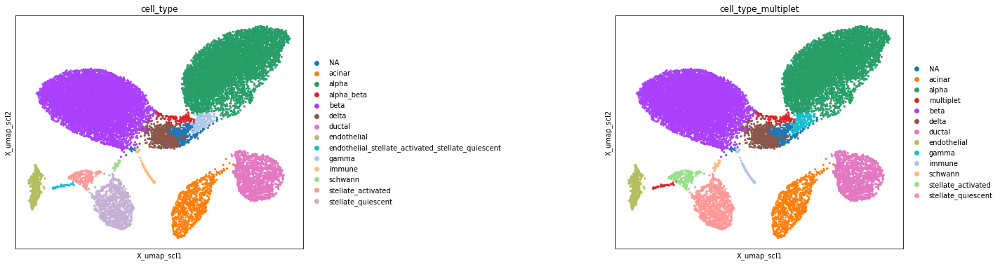

In [100]:
# Plot new cell types
rcParams['figure.figsize'] = (6, 6)
sc.pl.embedding(adata, 'X_umap_scl', color=['cell_type', 'cell_type_multiplet'], size=40, use_raw=False, wspace=0.9)

<AxesSubplot:>

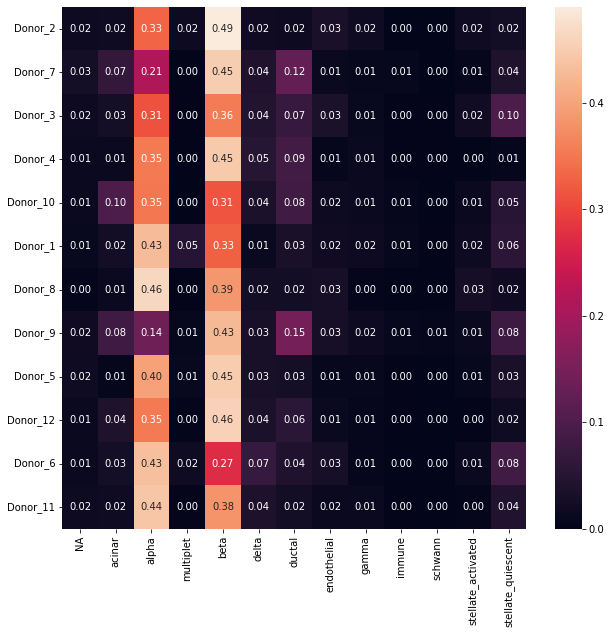

In [101]:
# ratio of each ct in each study
ct_study_ratios = pd.DataFrame()
for (study, hc), ratio in adata.obs.groupby('file', observed=True)['cell_type_multiplet'].value_counts(normalize=True, sort=False).iteritems():
    ct_study_ratios.at[study, hc] = ratio
ct_study_ratios.fillna(0, inplace=True)
fig, ax = plt.subplots(figsize=(ct_study_ratios.shape[1] * 0.8, ct_study_ratios.shape[0] * 0.8))
sb.heatmap(ct_study_ratios, ax=ax, annot=True, fmt='.2f')

<AxesSubplot:>

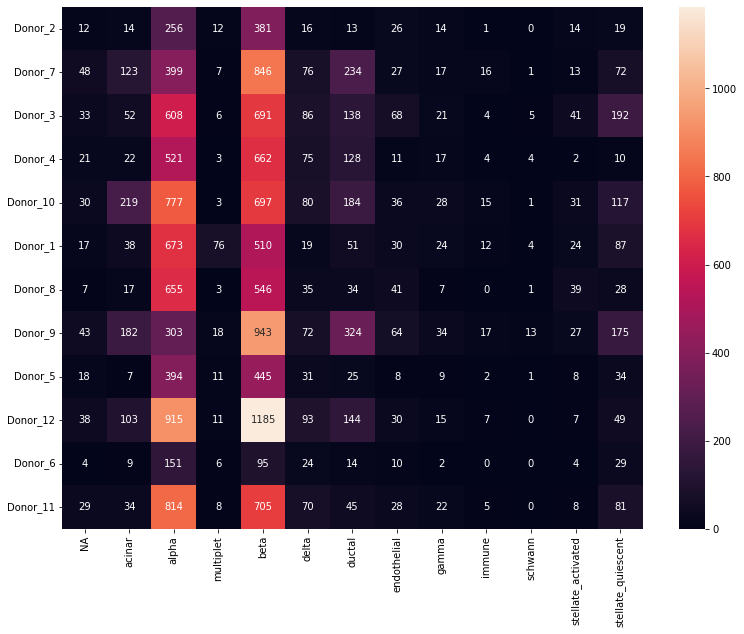

In [102]:
# Number of each ct in each study
ct_study_ratios = pd.DataFrame()
for (study, hc), ratio in adata.obs.groupby('file', observed=True)['cell_type_multiplet'].value_counts(normalize=False, sort=False).iteritems():
    ct_study_ratios.at[study, hc] = ratio
ct_study_ratios.fillna(0, inplace=True)
fig, ax = plt.subplots(figsize=(ct_study_ratios.shape[1] * 1, ct_study_ratios.shape[0] * 0.8))
sb.heatmap(ct_study_ratios, ax=ax, annot=True, fmt='.0f')

### Save annotation

In [103]:
#backup = adata.uns['rank_genes_groups_filtered']
del adata.uns['rank_genes_groups_filtered']

In [104]:
#h.save_h5ad(adata, shared_folder+"data_annotated.h5ad",unique_id2=UID2)
adata.write_h5ad(shared_folder + 'data_annotated.h5ad')
#pickle.dump(adata, open(shared_folder + 'data_annotated.pkl', 'wb'))